# dsp4bats - extract metrics

Uses the 'dsp4bats' library to extract metrics from bat sound. Metrics are calculate and stored as a dataframe before plotting.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import sys
path = ".."
sys.path.append(path)

In [3]:
import pathlib
import numpy as np
import pandas as pd
import os

os.chdir(r'C:\Users\Vicentico\Documents\cosas del SS\cloudedbats_dsp-master\dsp4bats')
import dsp4bats

In [4]:
high_pass_filter_freq_hz=15000
threshold_dbfs_below_peak = 20.0

In [5]:
def read_file_and_extract_metrics():
    
    # Read signal from file. Length 1 sec.
    wave_reader = dsp4bats.WaveFileReader(sound_file_path)
    samp_width = wave_reader.samp_width
    frame_rate = wave_reader.frame_rate
    sampling_freq = wave_reader.sampling_freq
    
    # Create dsp4bats utils.
    signal_util = dsp4bats.SignalUtil(sampling_freq)
    spectrum_util = dsp4bats.DbfsSpectrumUtil(window_size=128,
                                              window_function='kaiser',
                                              kaiser_beta=14,
                                              sampling_freq=sampling_freq)
    # Prepare output file for metrics.
    ##out_file_name = pathlib.Path(sound_file_path).stem + '_Metrics.txt'
    out_file = pathlib.Path(metrics_file_path).open('w')
    out_header = spectrum_util.chirp_metrics_header()
    out_file.write('\t'.join(map(str, out_header)) + '\n')# Read until end of file.
    
    # Read file.
    found_peak_counter = 0
    buffer_number = 0
    # Read buffer, 1 sec.
    signal_1sec = wave_reader.read_buffer()
    
    # Iterate over buffers.
    while len(signal_1sec) > 0:

        # Get noise level for 1 sec.
        noise_level = signal_util.noise_level(signal_1sec)
        noise_level_db = signal_util.noise_level_in_db(signal_1sec)
        print('Noise level: ', np.round(noise_level, 5), '   Noise (db): ', np.round(noise_level_db, 2))

        # Find peaks in time domain.
        peaks = signal_util.find_localmax(signal=signal_1sec,
                                          noise_threshold=noise_level*4.0, # Threshold.
                                          jump=int(sampling_freq/1000), # Jump 1 ms.
                                          frame_length=1024) # Window size.
        for peak_position in peaks:

            # Extract metrics.
            result = spectrum_util.chirp_metrics(
                                        signal=signal_1sec, 
                                        peak_position=peak_position, 
                                        jump_factor=4000, 
                                        high_pass_filter_freq_hz=high_pass_filter_freq_hz, 
                                        threshold_dbfs = noise_level_db, # + 5.0, 
                                        threshold_dbfs_below_peak = threshold_dbfs_below_peak, 
                                        max_frames_to_check=100, 
                                        max_silent_slots=8, 
                                        debug=False)
            if result is False:
                continue # 
            else:
                result_dict = dict(zip(out_header, result))
                ## out_row = [result_dict.get(x, '') for x in out_header]
                # Add buffer steps to peak_signal_index, start_signal_index and end_signal_index.
                out_row = []
                for key in out_header:
                    if '_signal_index' in key:
                        # Adjust index if more than one buffer was read.
                        index = int(result_dict.get(key, 0))
                        index += buffer_number * signal_util.sampling_freq
                        out_row.append(index)
                    else:
                        out_row.append(result_dict.get(key, ''))
                # Write to file.
                out_file.write('\t'.join(map(str, out_row)) + '\n')
                #
                found_peak_counter += 1
        #
        buffer_number += 1
        # Read next buffer.
        signal_1sec = wave_reader.read_buffer()
        
    # Done.
    print('Detected peak counter: ' + str(found_peak_counter))
    wave_reader.close()
    out_file.close()
    #
    return sampling_freq # We need this later...


In [6]:
# Read the produced text file as a dataframe. Calculate and add more columns.
def read_metrics_from_file():
    
    # Read dataframe.
    peak_df = pd.read_csv(metrics_file_path, sep="\t")
    peak_df.tail()
    #print(peak_df)
    # Plot time instead of index.
    peak_df['time_peak_s'] = peak_df.peak_signal_index / sampling_freq
    peak_df['time_start_s'] = peak_df.start_signal_index / sampling_freq
    peak_df['time_end_s'] = peak_df.end_signal_index / sampling_freq
    # Calculate intervals between chirps.
    peak_df['interval_s'] = peak_df.time_peak_s.diff()
    peak_df.loc[(peak_df.interval_s > 0.2)] = -1 # Too long interval.

    return peak_df

In [7]:
read_file_and_extract_metrics()

NameError: name 'sound_file_path' is not defined

In [8]:
# Plot two diagrams to visualise metrics.
def plot_diagrams():
    fig, (ax1, ax2) = plt.subplots(2,1,
                            figsize=(16, 10), 
                            dpi=150,
                            sharex=True)
    # ax1 - peak freq, etc.
    cs1 = ax1.scatter(
                x=peak_df.time_peak_s,
                y=peak_df.peak_freq_khz,
                s=150,
                c=peak_df.peak_dbfs,
                cmap=plt.get_cmap('Reds'),  #'YlOrRd'
                alpha=0.5)
    ax1.vlines(x=peak_df.time_peak_s, 
               #ymin=peak_df.start_freq_khz, 
               #ymax=peak_df.end_freq_khz,
               ymin=peak_df.max_freq_khz, 
               ymax=peak_df.min_freq_khz,
               linewidth=0.5, 
               alpha=0.8
              )
    ax1.hlines(y=peak_df.peak_freq_khz, 
               xmin=peak_df.time_start_s, 
               xmax=peak_df.time_end_s,
               linewidth=0.5, 
               alpha=0.8
              )
    cbar = fig.colorbar(cs1, ax=ax1, label='dBFS')
    ax1.set_ylim((0,120))
    ax1.minorticks_on()
    ax1.grid(which='major', linestyle='-', linewidth='0.5', alpha=0.6)
    ax1.grid(which='minor', linestyle='-', linewidth='0.5', alpha=0.3)
    ax1.tick_params(which='both', top='off', left='off', right='off', bottom='off')
    
    # ax2 - interval.
    cs2 = ax2.scatter(
                 x=peak_df.time_peak_s,
                 y=peak_df.interval_s,
                 s=40,
                 color='blue',
                 label='Interval (s)',
                 alpha=0.5
                )    
    ax2.set_ylim((0,0.2))
    ax2.minorticks_on()
    ax2.grid(which='major', linestyle='-', linewidth='0.5', alpha=0.6)
    ax2.grid(which='minor', linestyle='-', linewidth='0.5', alpha=0.3)
    ax2.tick_params(which='both', top='off', left='off', right='off', bottom='off') 
    
    # ax3 - duration.
    ax3 = ax2.twinx()
    ax3.scatter(
                 x=peak_df.time_peak_s,
                 y=peak_df.duration_ms,
                 s=40,
                 marker='s',
                 color='red',
                 label='Duration (ms)',
                 alpha=0.5
                )
    ax3.set_ylim((0,20.0))
    
    # Legends
    ax2.legend(loc='upper left')
    ax3.legend(loc='upper right')
    
    # Adjust size on second diagram.
    pos = ax1.get_position()
    pos2 = ax2.get_position()
    ax2.set_position([pos.x0,pos2.y0,pos.width,pos2.height])
    ax3.set_position([pos.x0,pos2.y0,pos.width,pos2.height])
    
    # Titles and labels.
    file_name = pathlib.Path(sound_file_path).name
    fig.suptitle('Metrics from: ' + file_name, 
                 fontsize=12, fontweight='bold', ha='right')
    ax1.set_title('Peak and min/max frequencies, amplitude and start/stop time')
    ax1.set_xlabel('Time(s)')
    ax1.set_ylabel('Frequency (kHz)')
    ax2.set_xlabel('Time(s)')
    ax2.set_title('Interval (s) and duration (ms)')
    ax2.set_ylabel('Interval (s)')
    ax3.set_ylabel('Duration (ms)')
    
    # Save and plot.
    fig.savefig(plot_file_path)
    plt.show()

In [11]:
import os
os.chdir (r"C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119")
direct= (r"C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119")


C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002106.wav
Noise level:  0.01532    Noise (db):  -36.3
Detected peak counter: 1


C:\Users\Vicentico\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


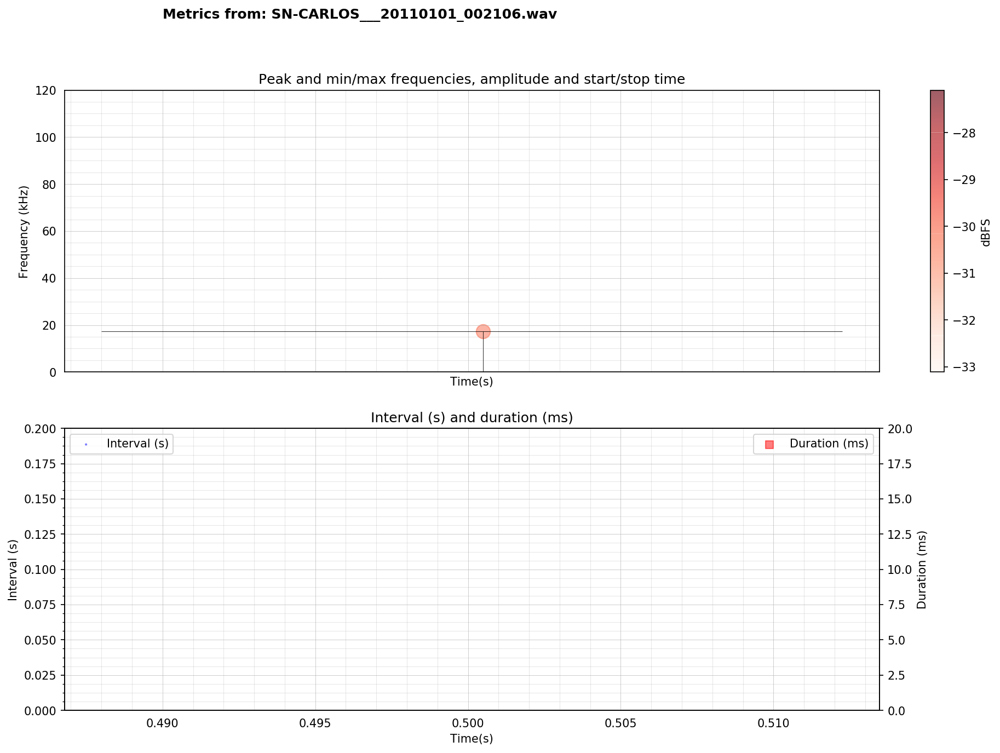

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002503.wav
Noise level:  0.00938    Noise (db):  -40.55
Detected peak counter: 0


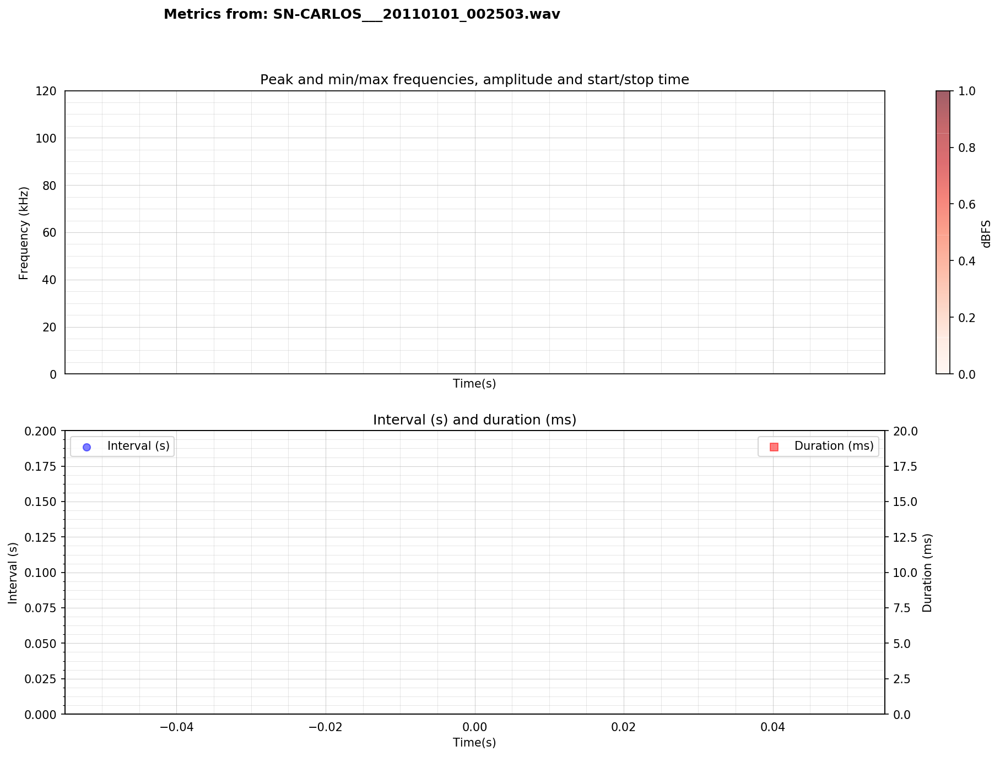

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002516.wav
Noise level:  0.00924    Noise (db):  -40.69
Detected peak counter: 0


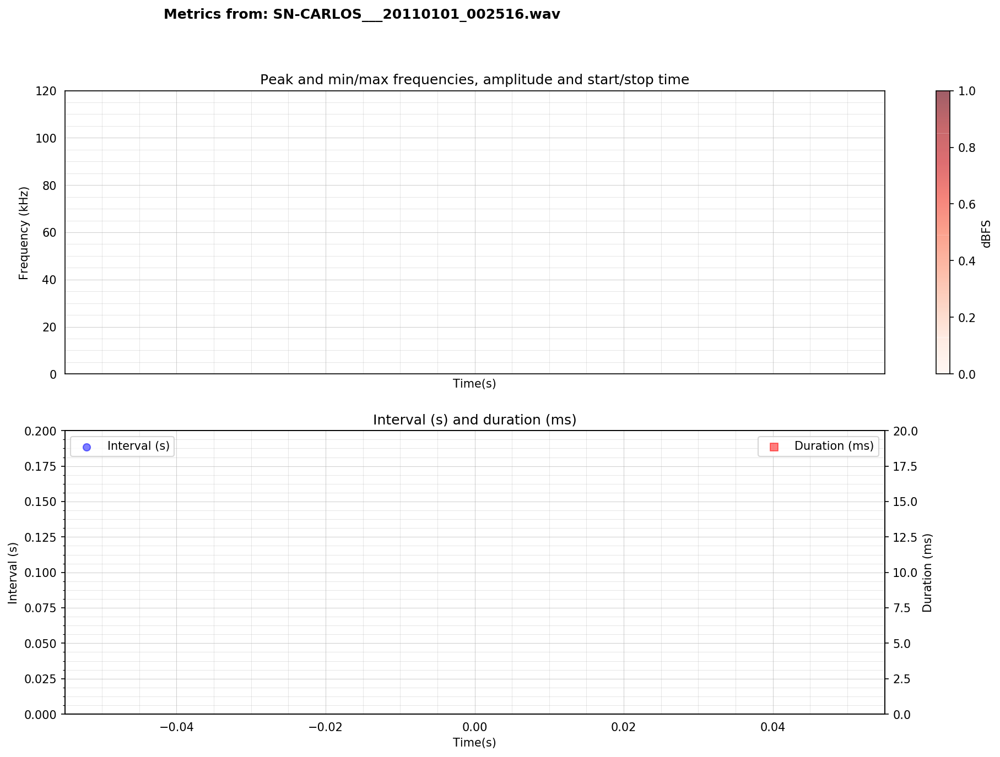

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002737.wav
Noise level:  0.01004    Noise (db):  -39.96
Detected peak counter: 1


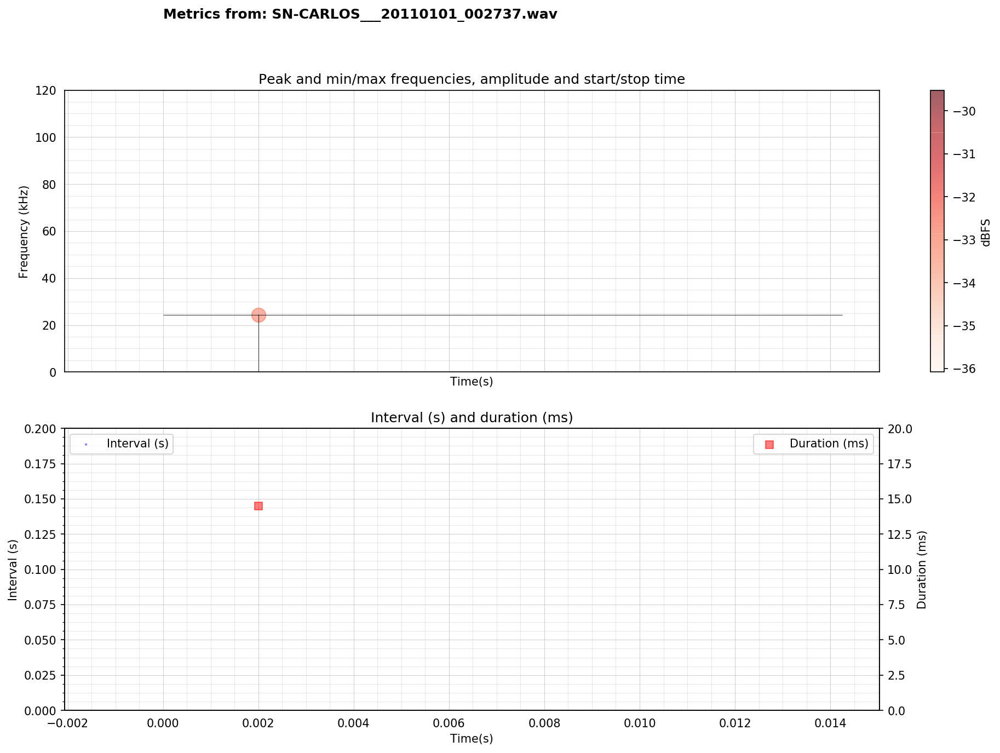

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002757.wav
Noise level:  0.00936    Noise (db):  -40.57
Detected peak counter: 0


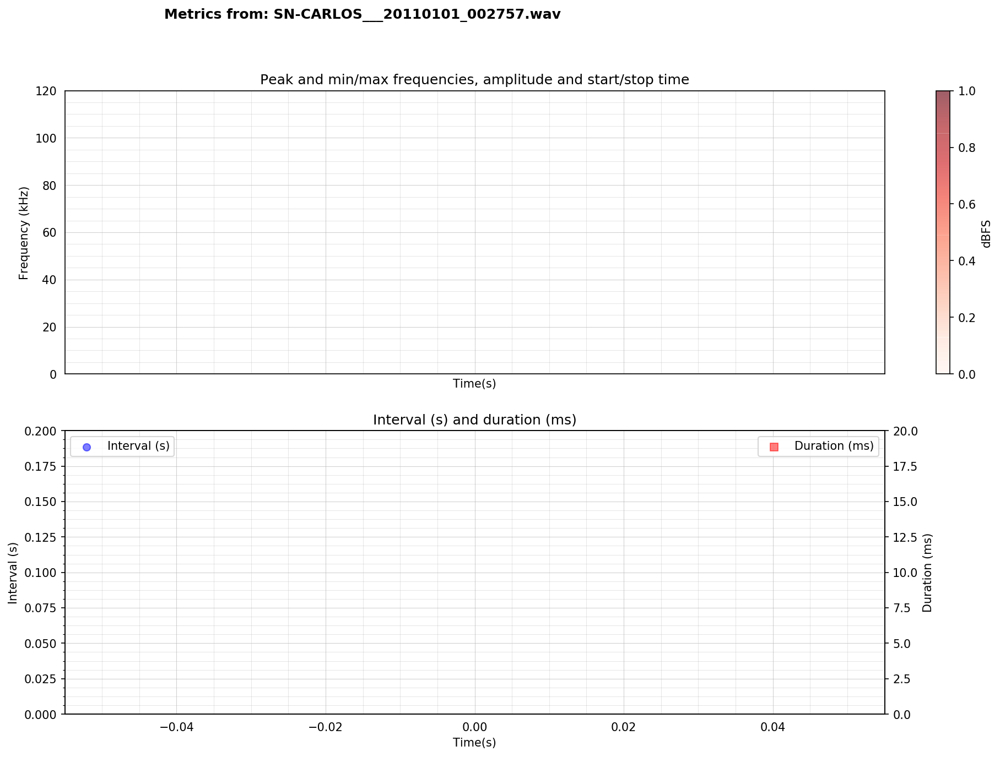

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002820.wav
Noise level:  0.03067    Noise (db):  -30.26
Detected peak counter: 0


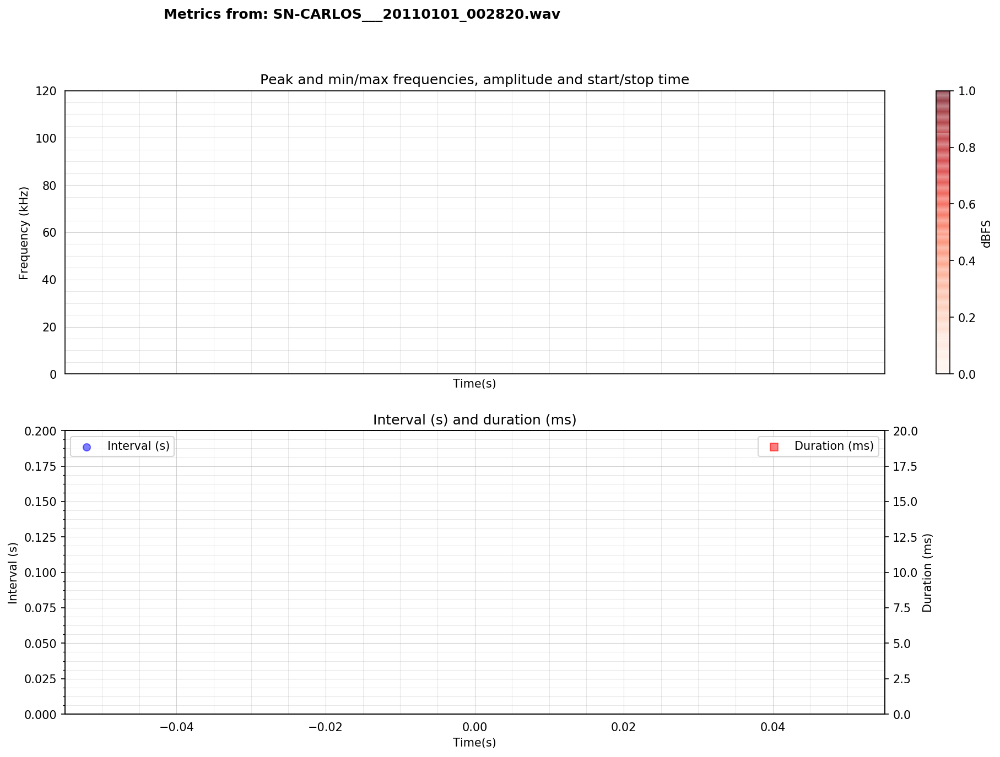

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002838.wav
Noise level:  0.01318    Noise (db):  -37.6
Detected peak counter: 0


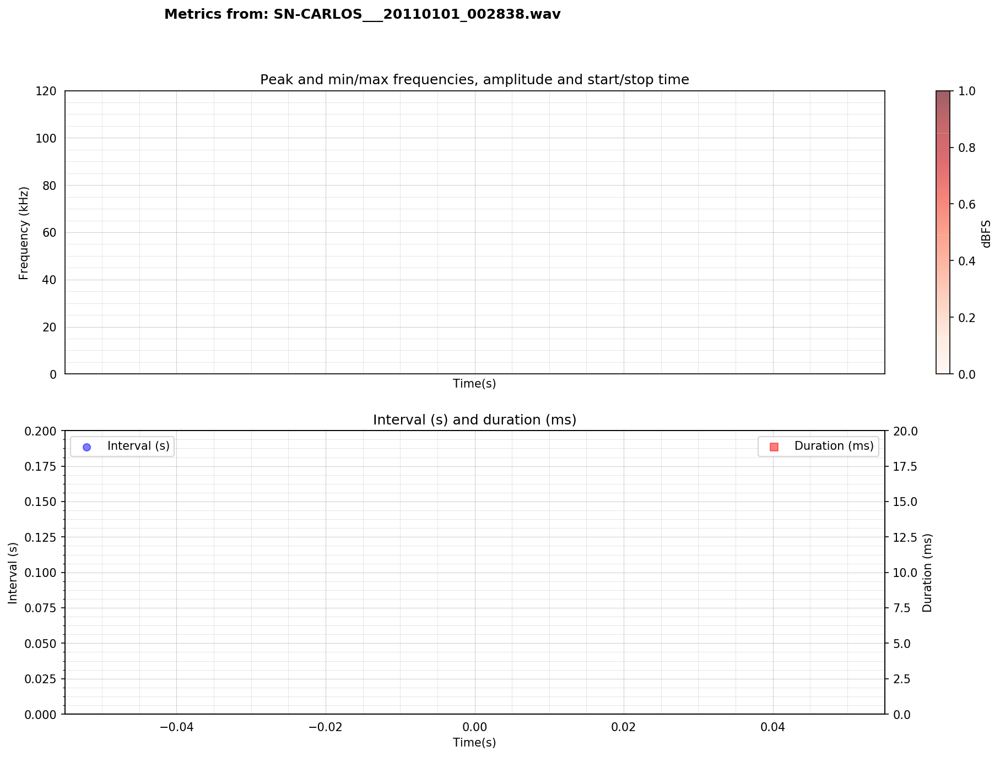

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002840.wav
Noise level:  0.03625    Noise (db):  -28.81
Detected peak counter: 2


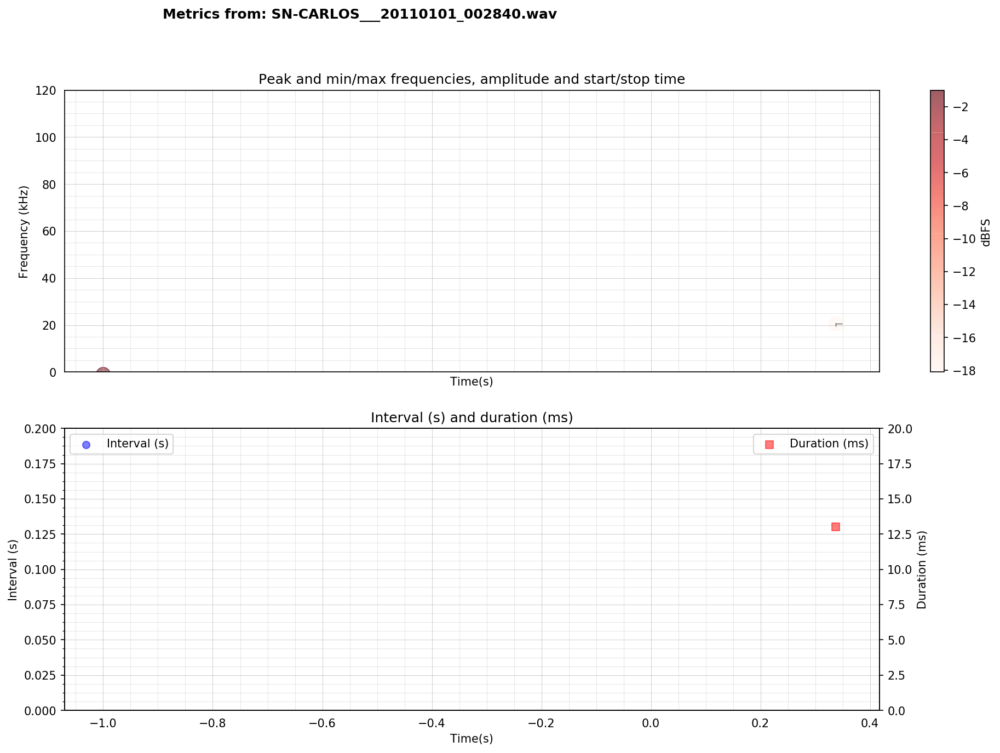

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002843.wav
Noise level:  0.01264    Noise (db):  -37.96
Detected peak counter: 0


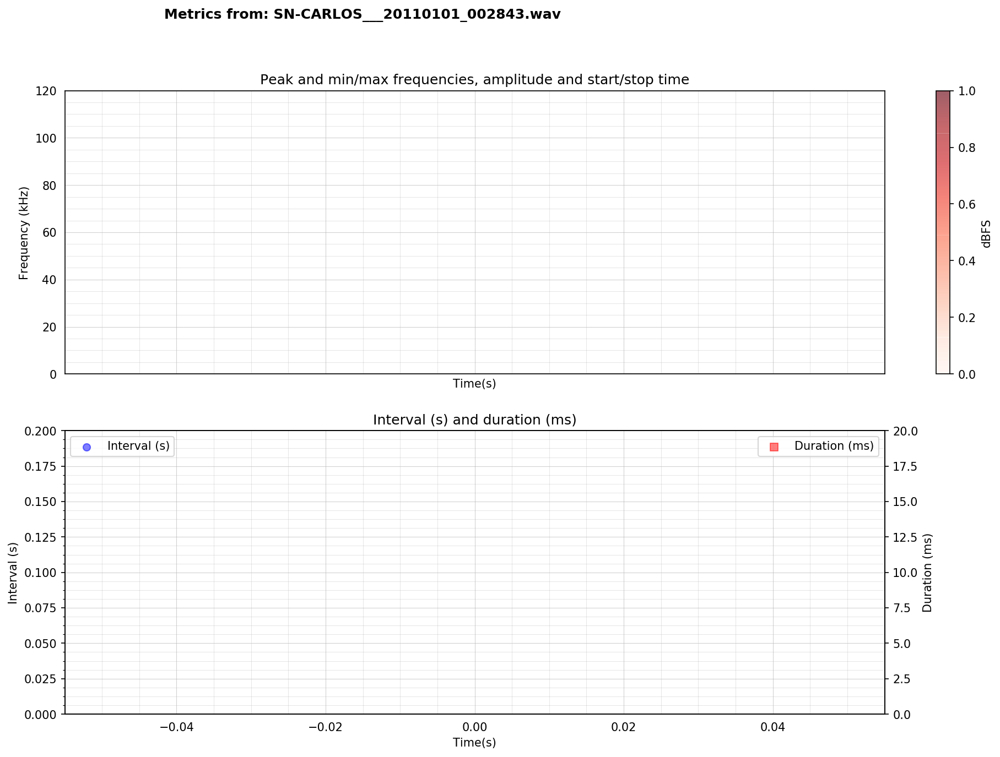

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002851.wav
Noise level:  0.01225    Noise (db):  -38.24
Detected peak counter: 0


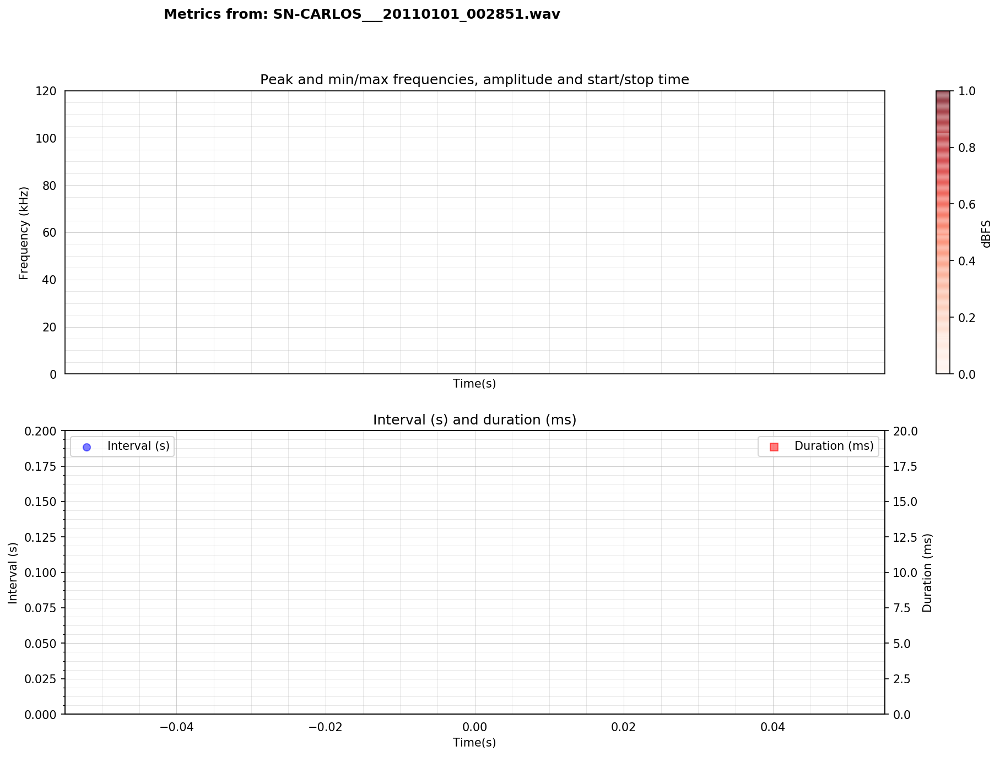

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002854.wav
Noise level:  0.01593    Noise (db):  -35.95
Detected peak counter: 0


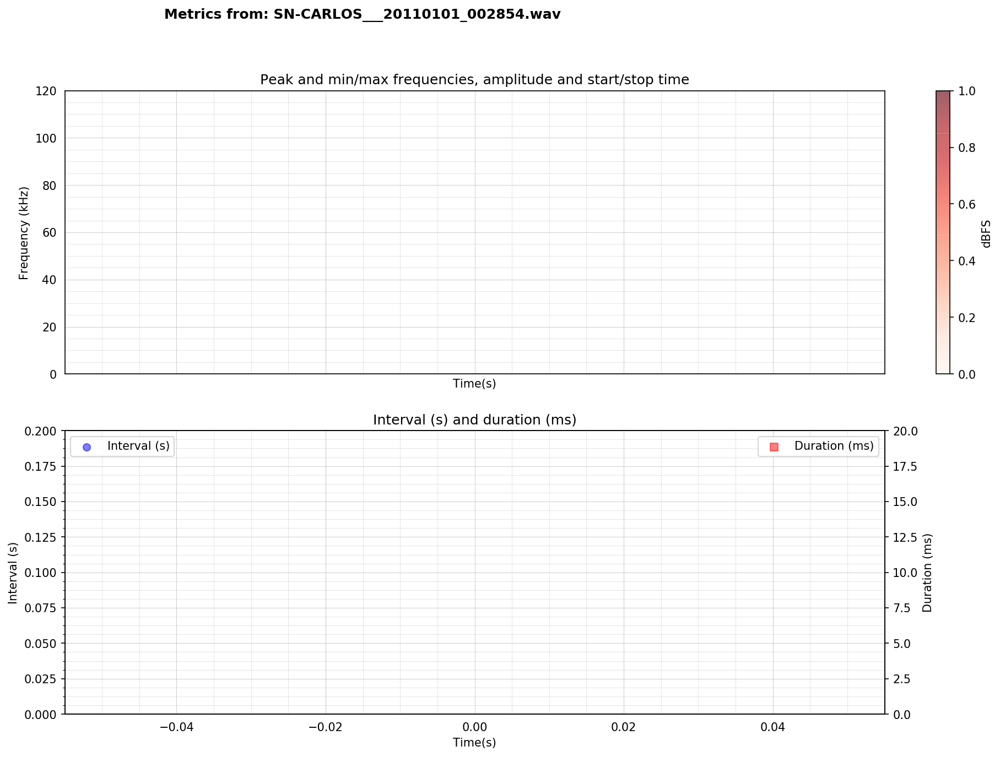

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002858.wav
Noise level:  0.03488    Noise (db):  -29.15
Detected peak counter: 0


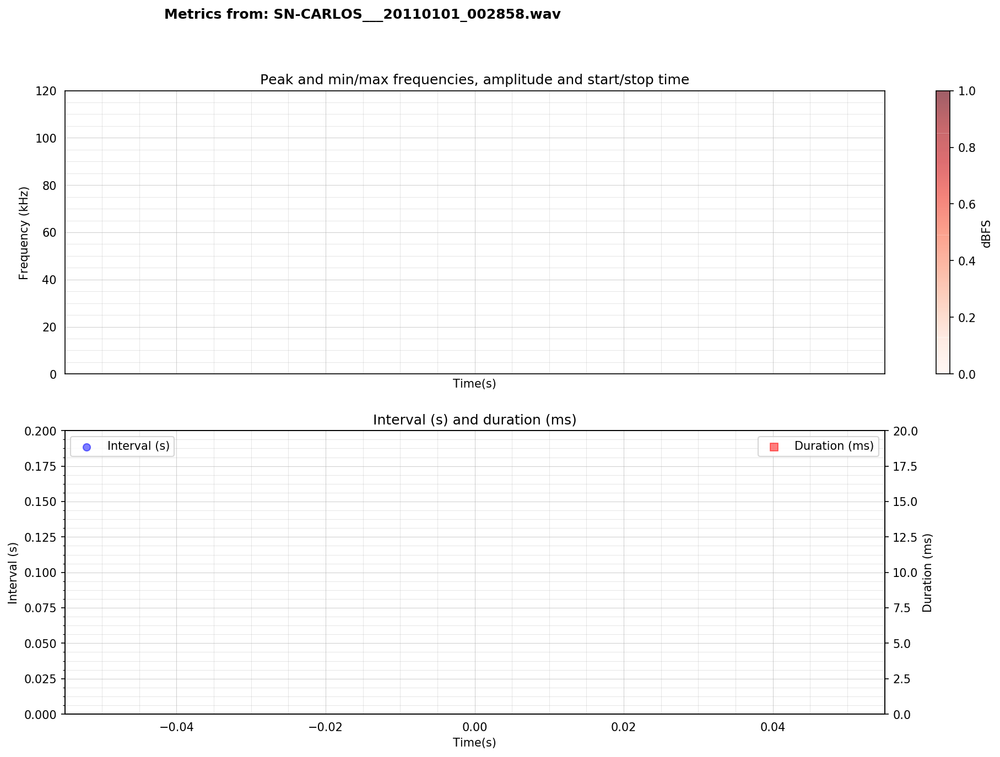

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002908.wav
Noise level:  0.01275    Noise (db):  -37.89
Detected peak counter: 0


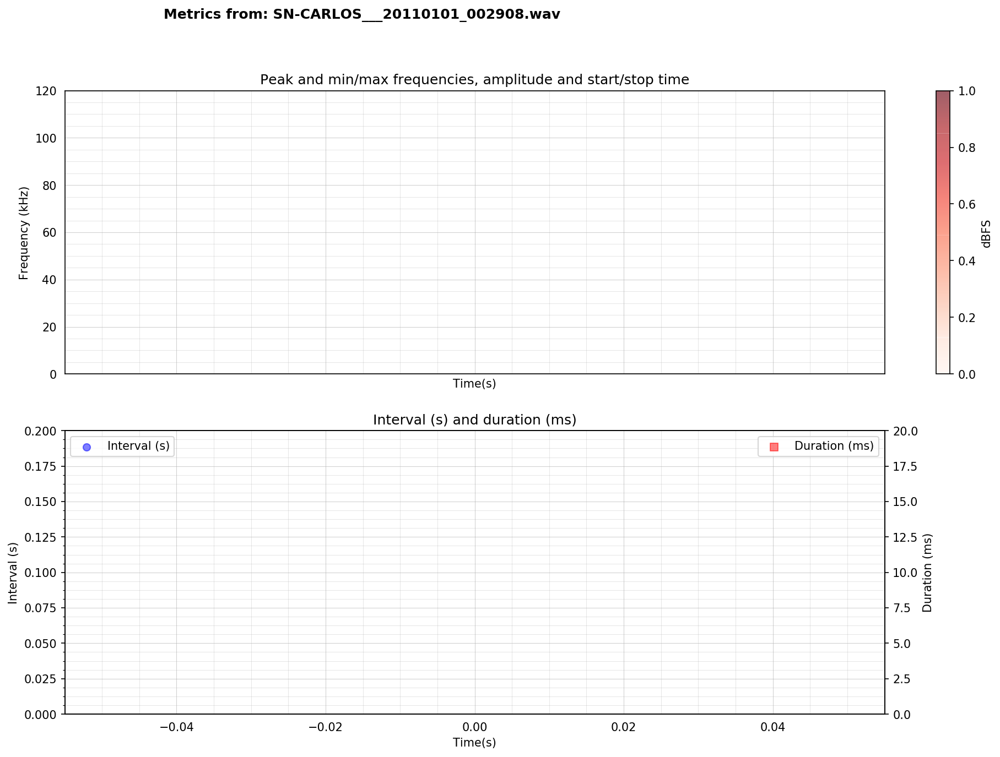

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002911.wav
Noise level:  0.03012    Noise (db):  -30.42
Detected peak counter: 0


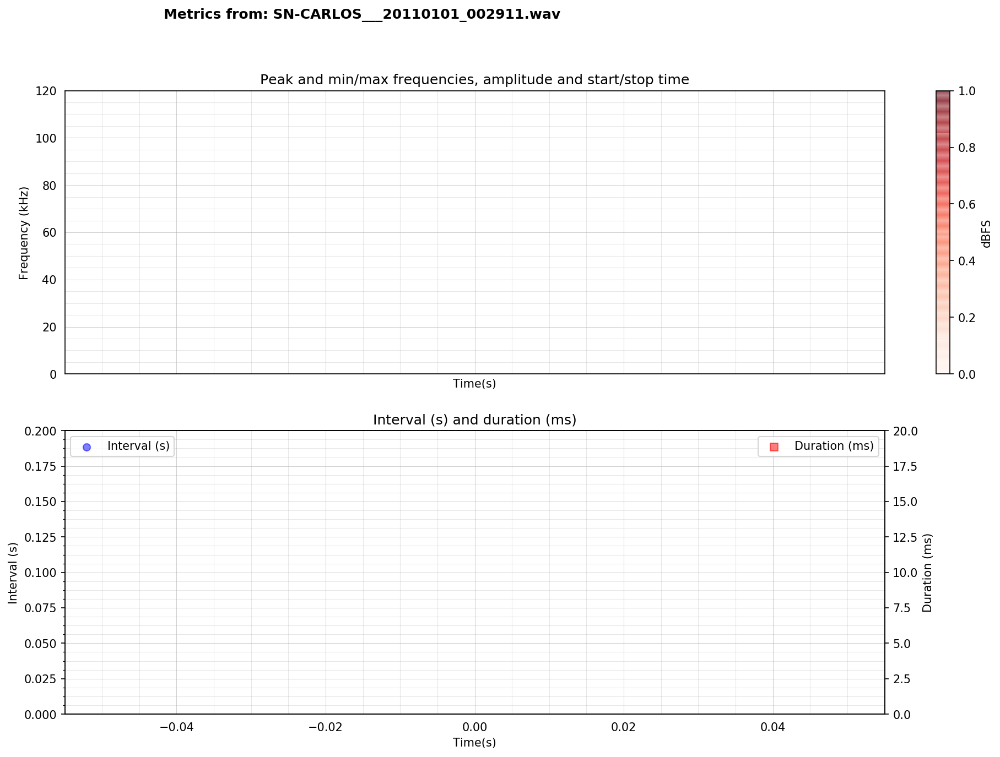

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_002914.wav
Noise level:  0.01338    Noise (db):  -37.47
Detected peak counter: 0


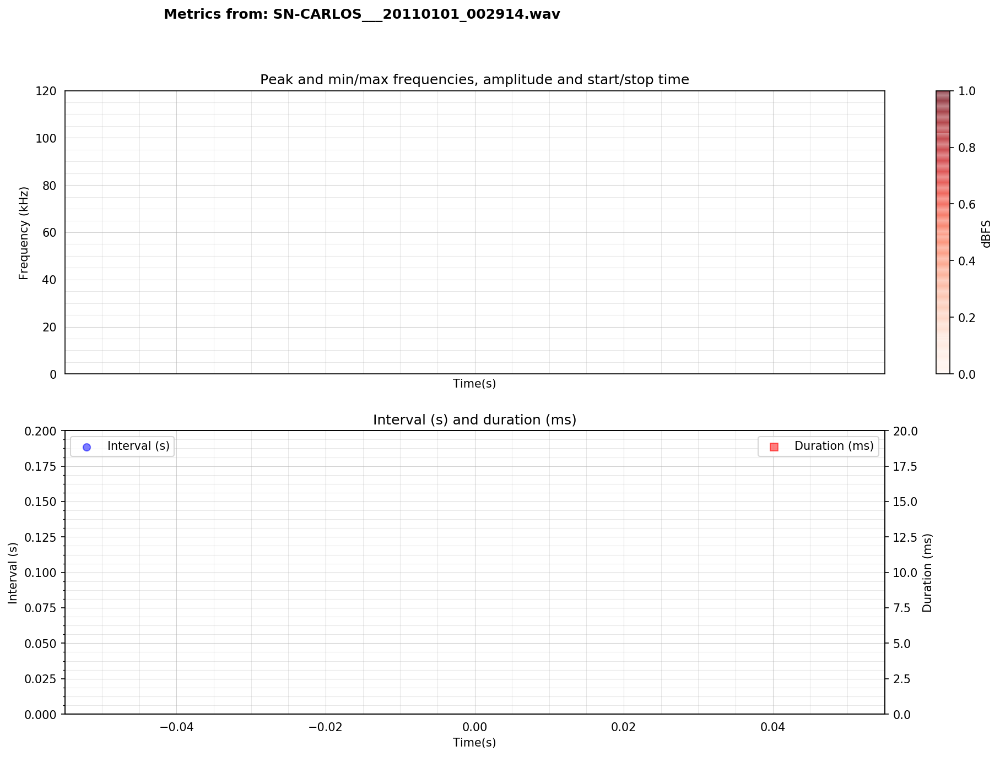

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003027.wav
Noise level:  0.01588    Noise (db):  -35.99
Detected peak counter: 1


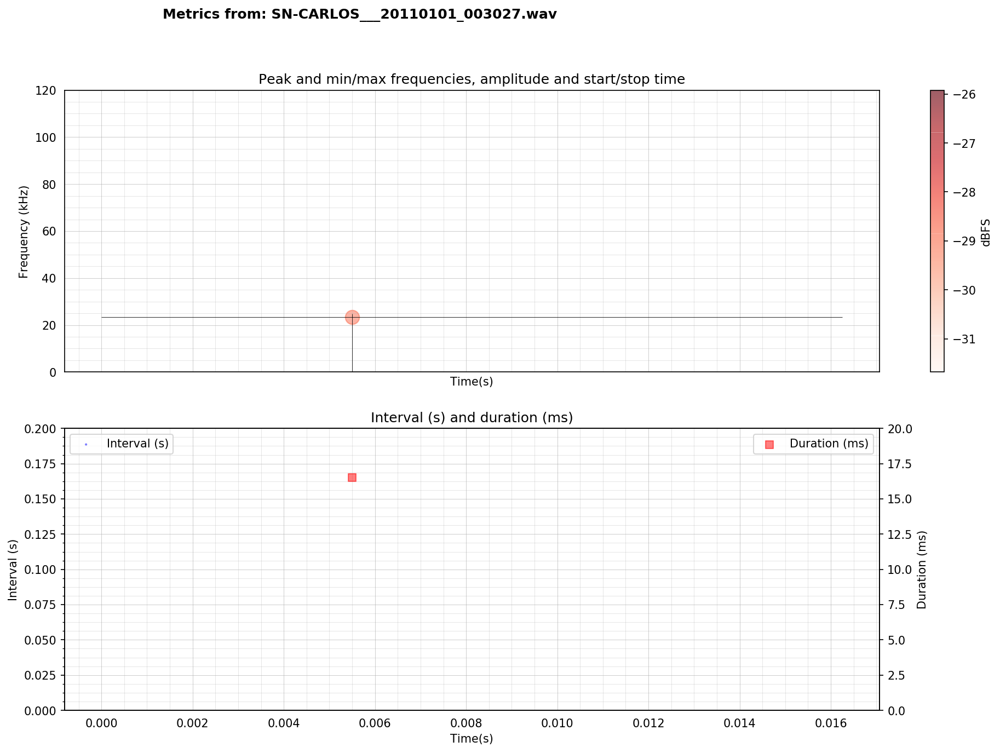

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003030.wav
Noise level:  0.01204    Noise (db):  -38.39
Detected peak counter: 0


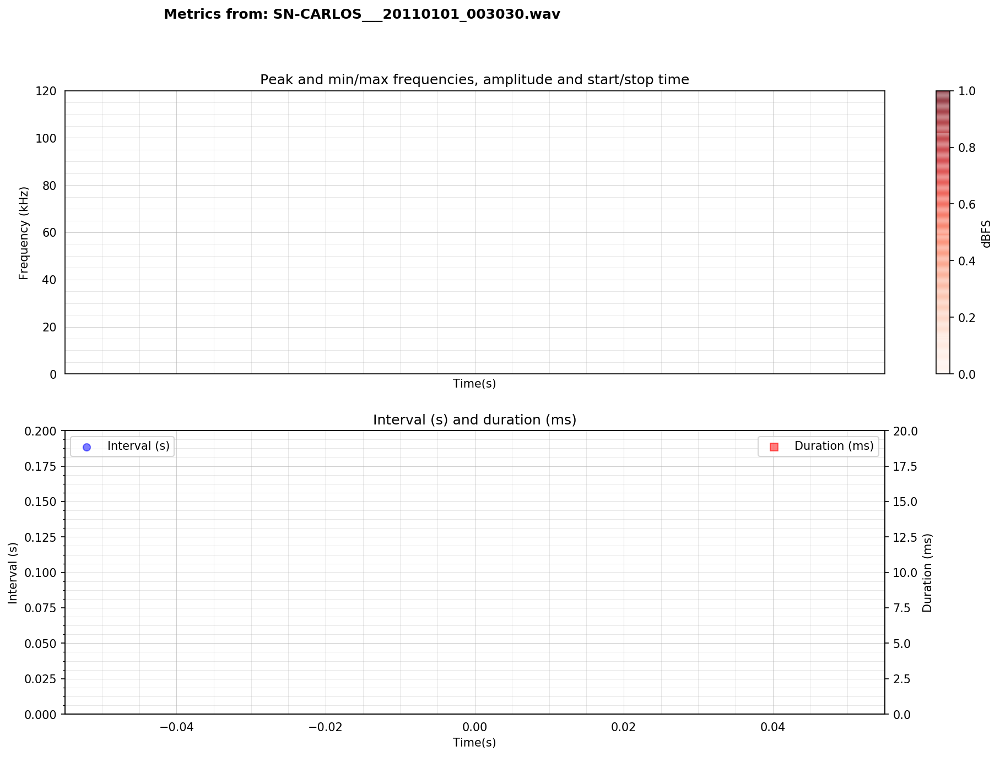

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003056.wav
Noise level:  0.03263    Noise (db):  -29.73
Detected peak counter: 0


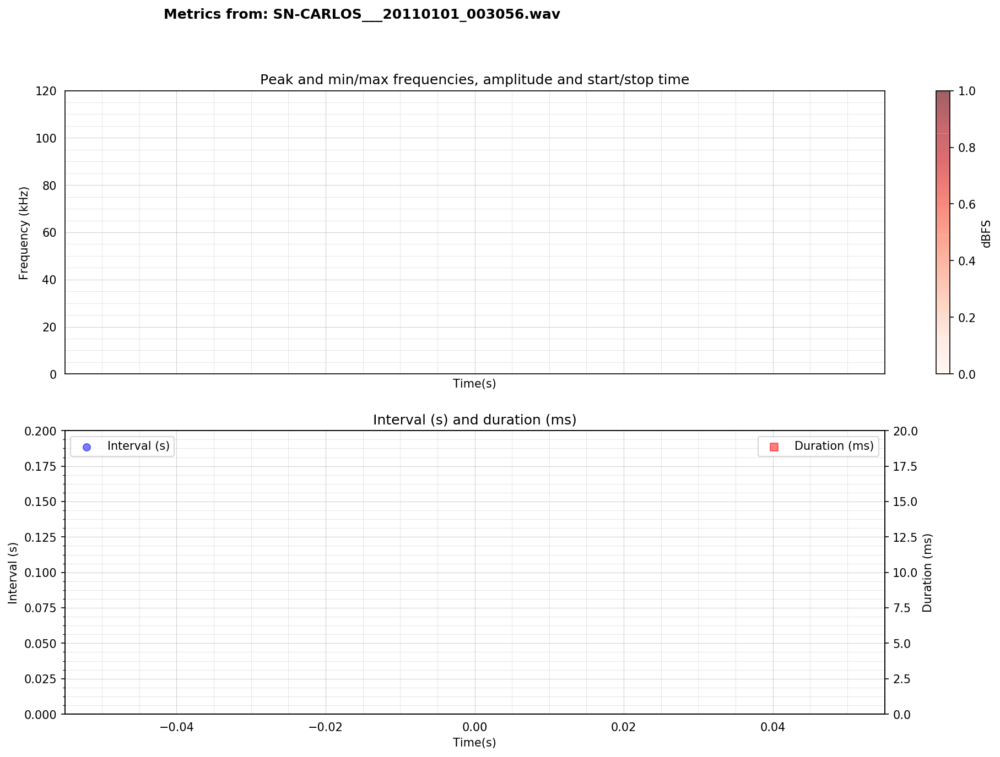

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003138.wav
Noise level:  0.01138    Noise (db):  -38.88
Detected peak counter: 0


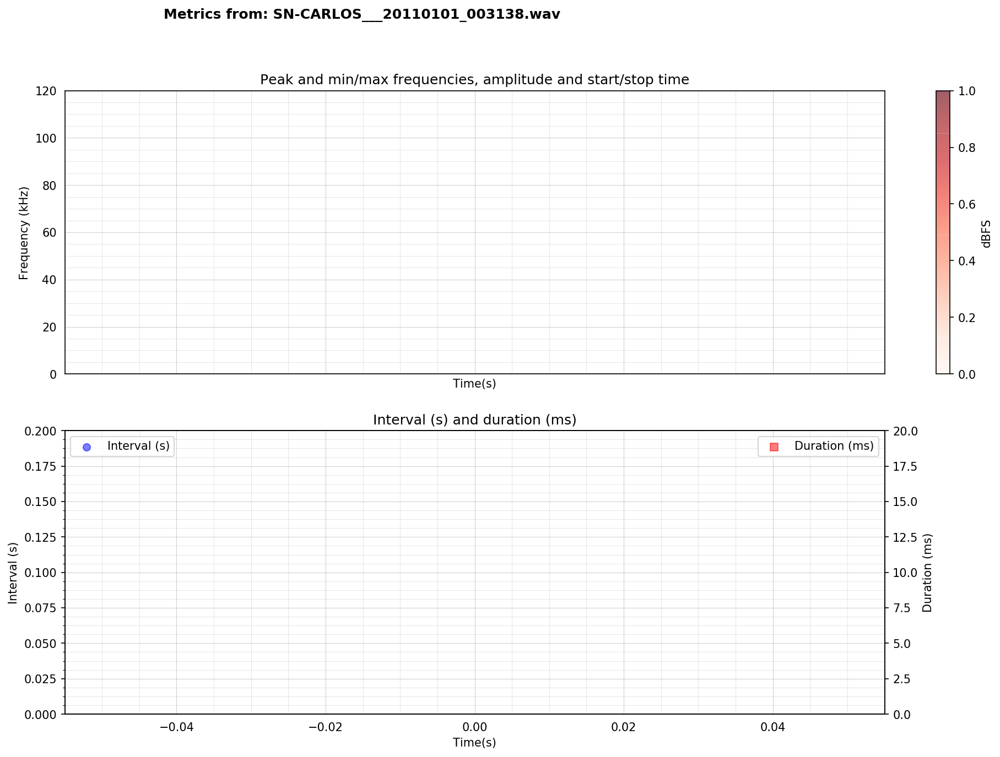

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003445.wav
Noise level:  0.00887    Noise (db):  -41.04
Detected peak counter: 0


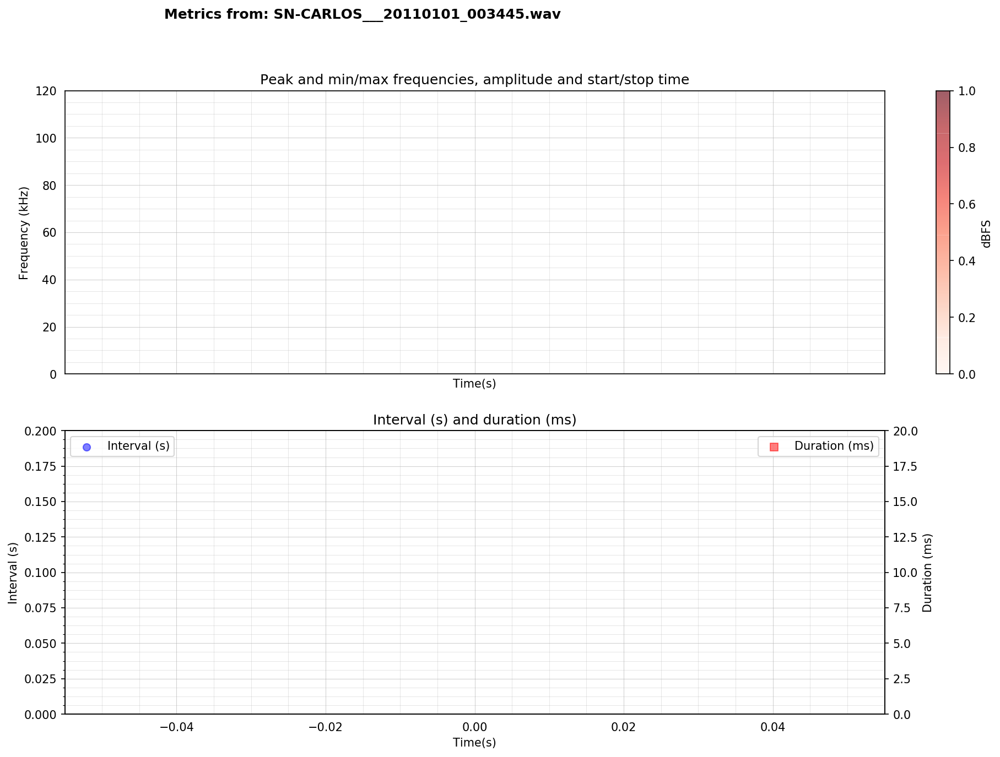

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003516.wav
Noise level:  0.0087    Noise (db):  -41.21
Detected peak counter: 0


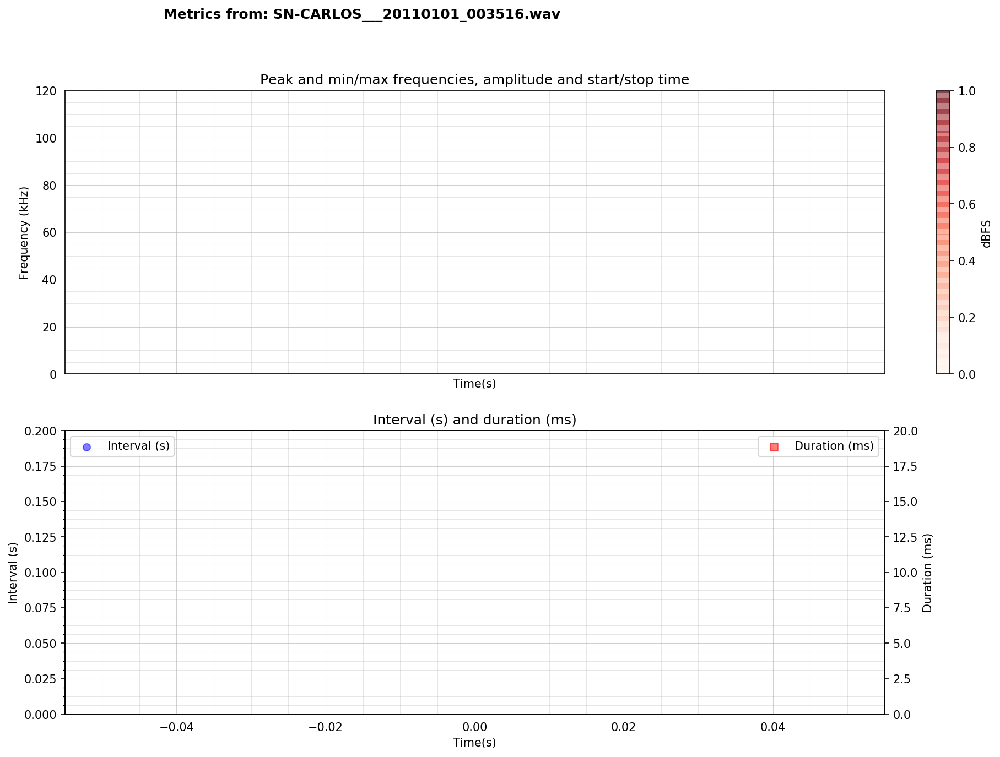

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003602.wav
Noise level:  0.00878    Noise (db):  -41.13
Detected peak counter: 0


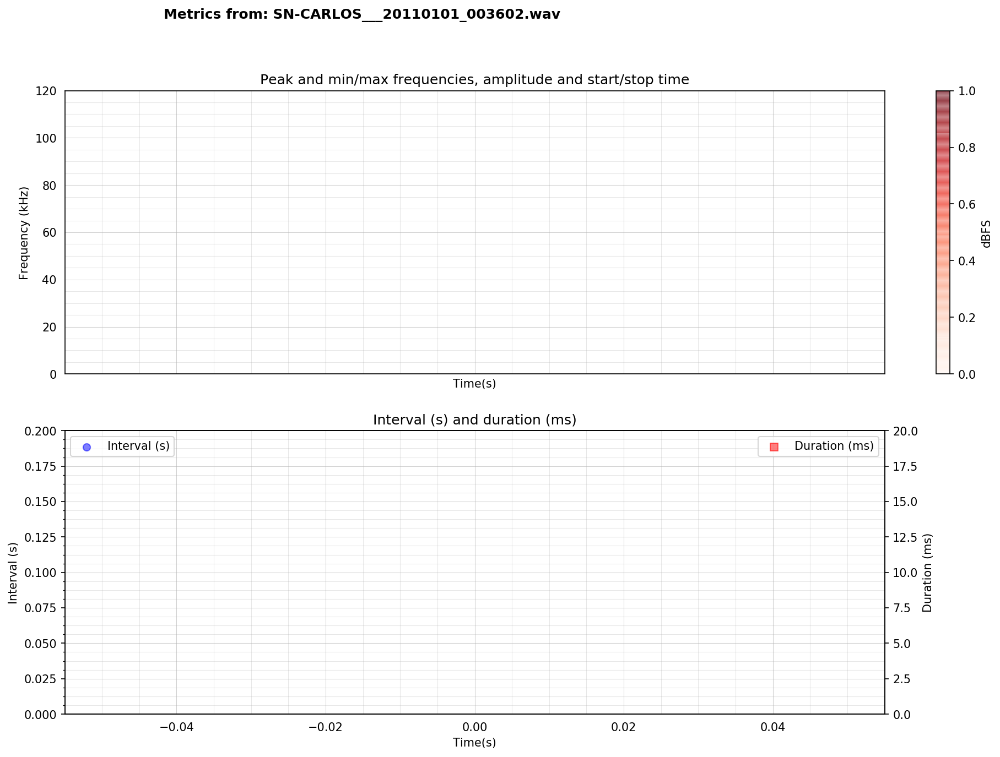

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003641.wav
Noise level:  0.01034    Noise (db):  -39.71
Detected peak counter: 1


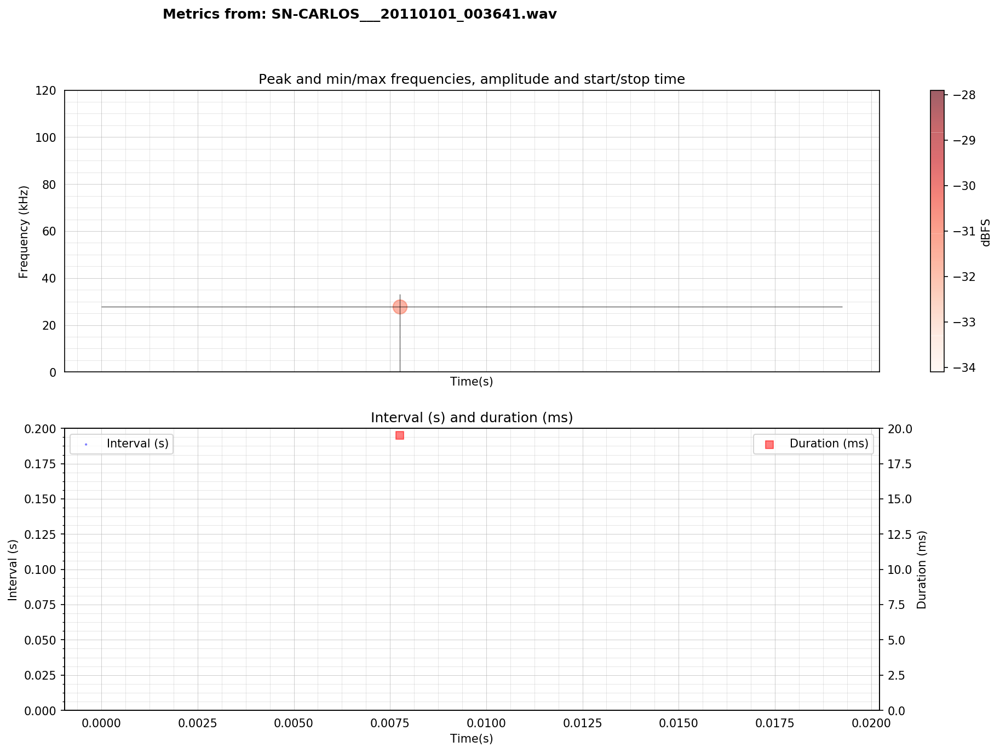

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_003740.wav
Noise level:  0.00914    Noise (db):  -40.79
Detected peak counter: 0


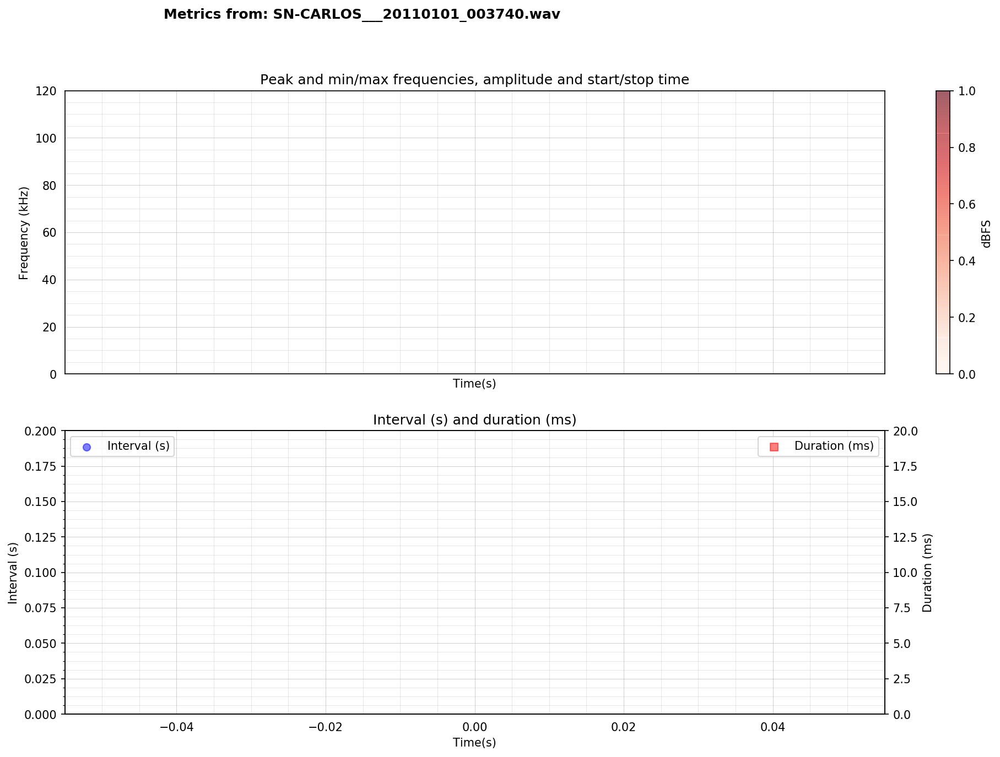

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_004957.wav
Noise level:  0.009    Noise (db):  -40.92
Detected peak counter: 0


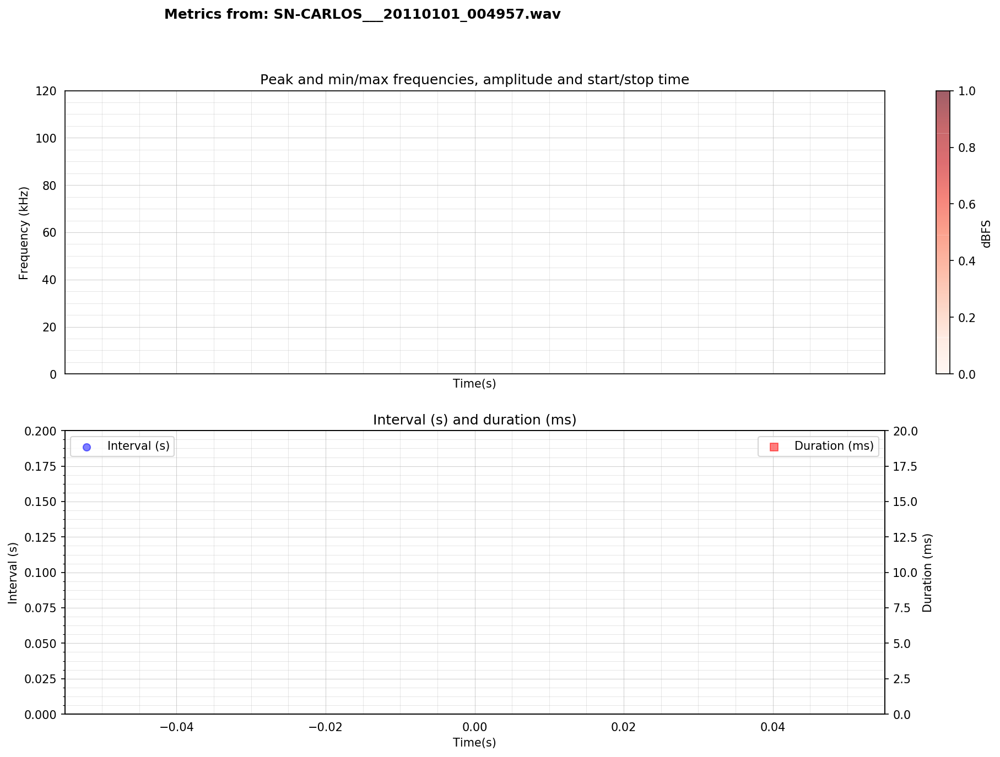

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_005055.wav
Noise level:  0.00915    Noise (db):  -40.78
Detected peak counter: 0


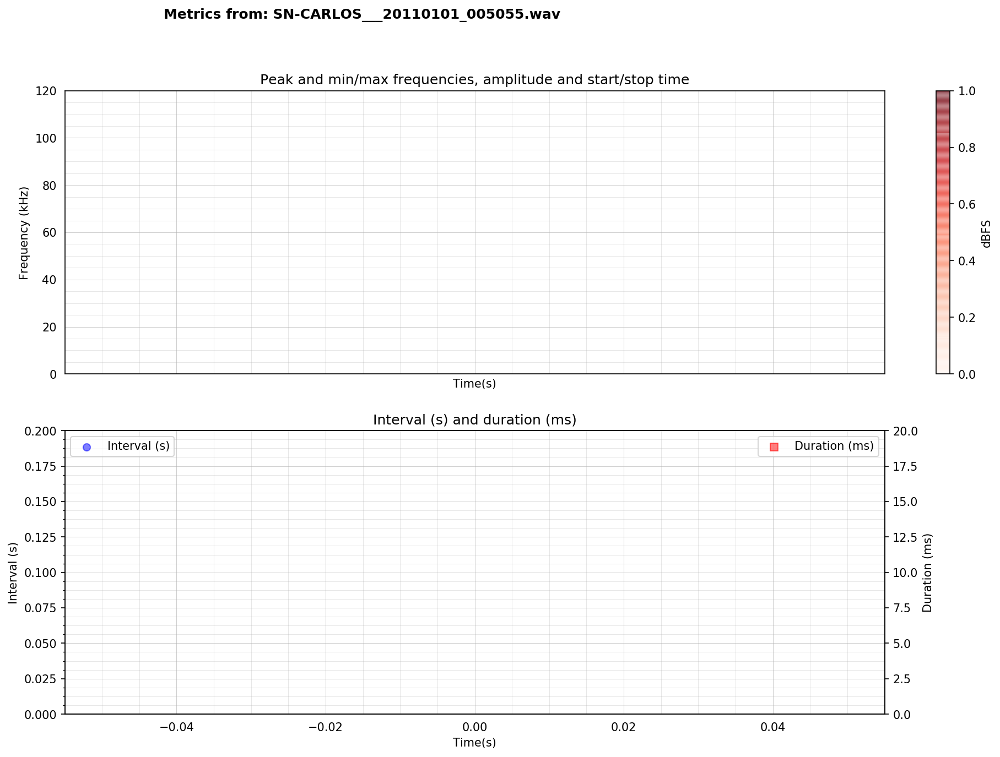

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010223.wav
Noise level:  0.00931    Noise (db):  -40.62
Detected peak counter: 0


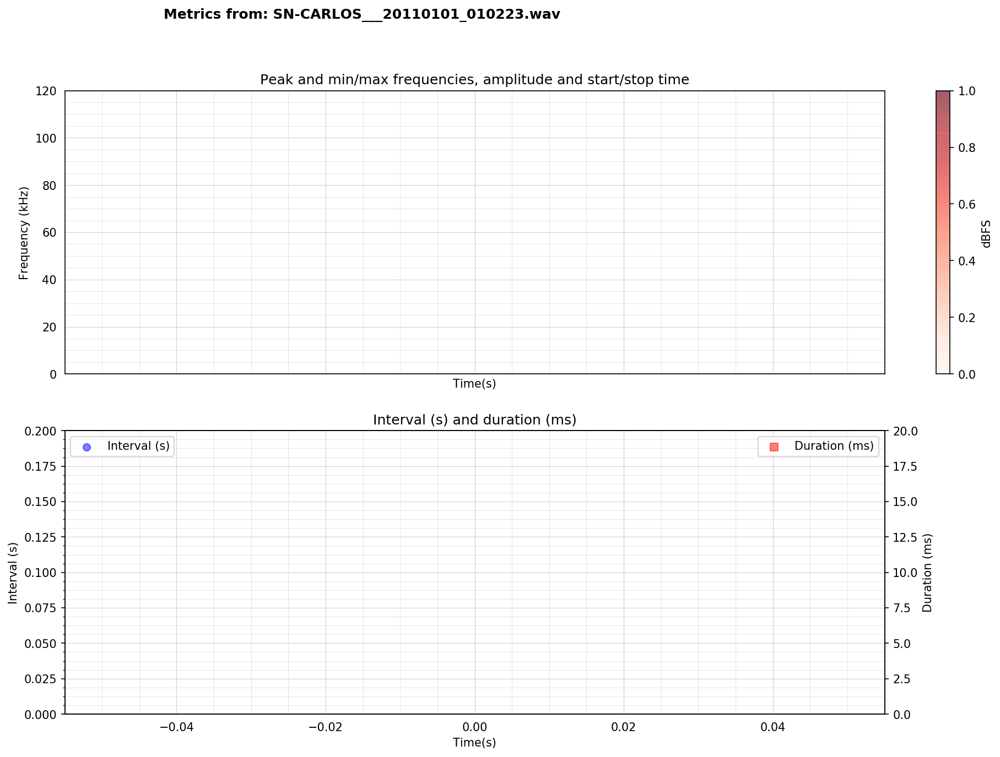

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010226.wav
Noise level:  0.00906    Noise (db):  -40.85
Detected peak counter: 0


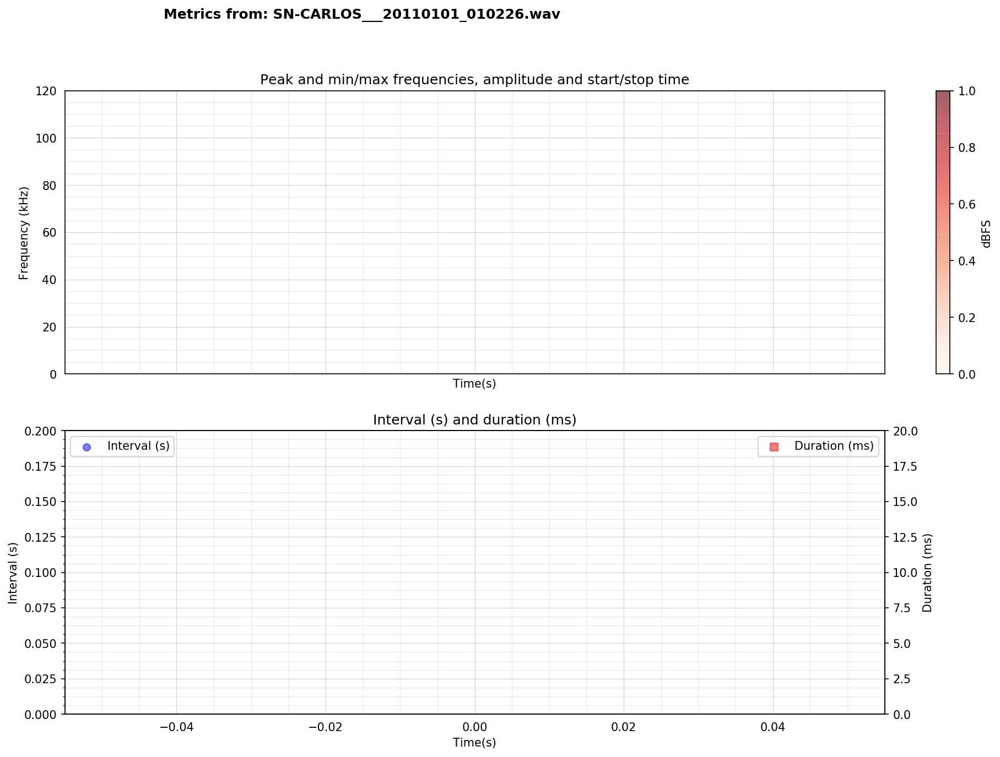

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010439.wav
Noise level:  0.00895    Noise (db):  -40.97
Detected peak counter: 0


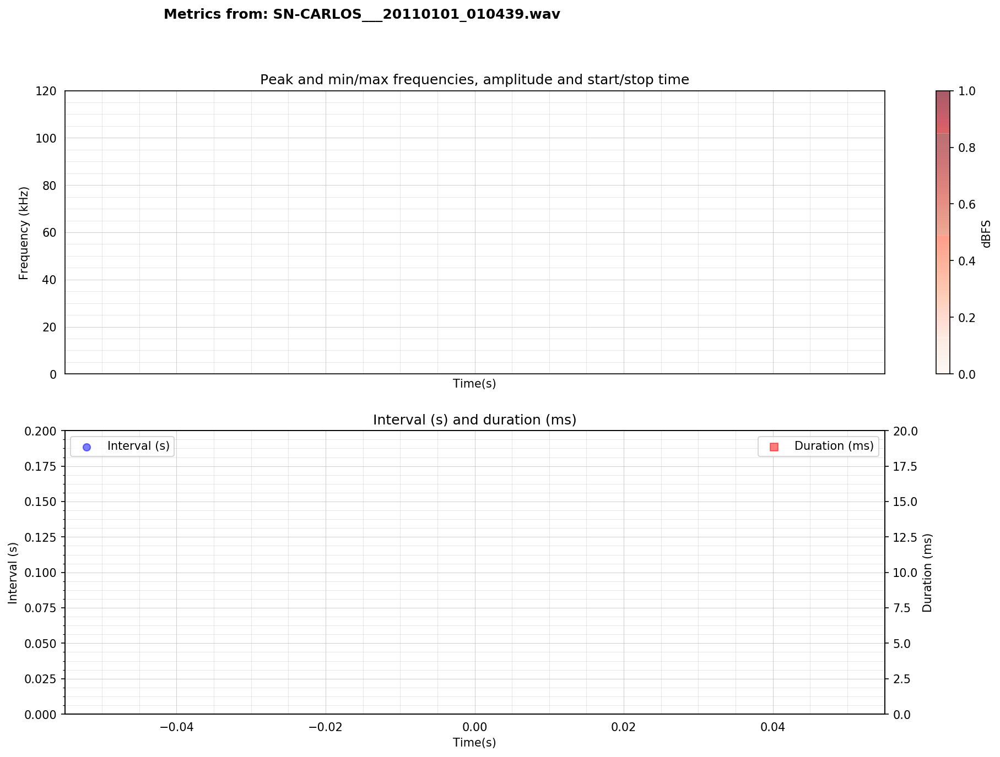

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010537.wav
Noise level:  0.00895    Noise (db):  -40.96
Detected peak counter: 0


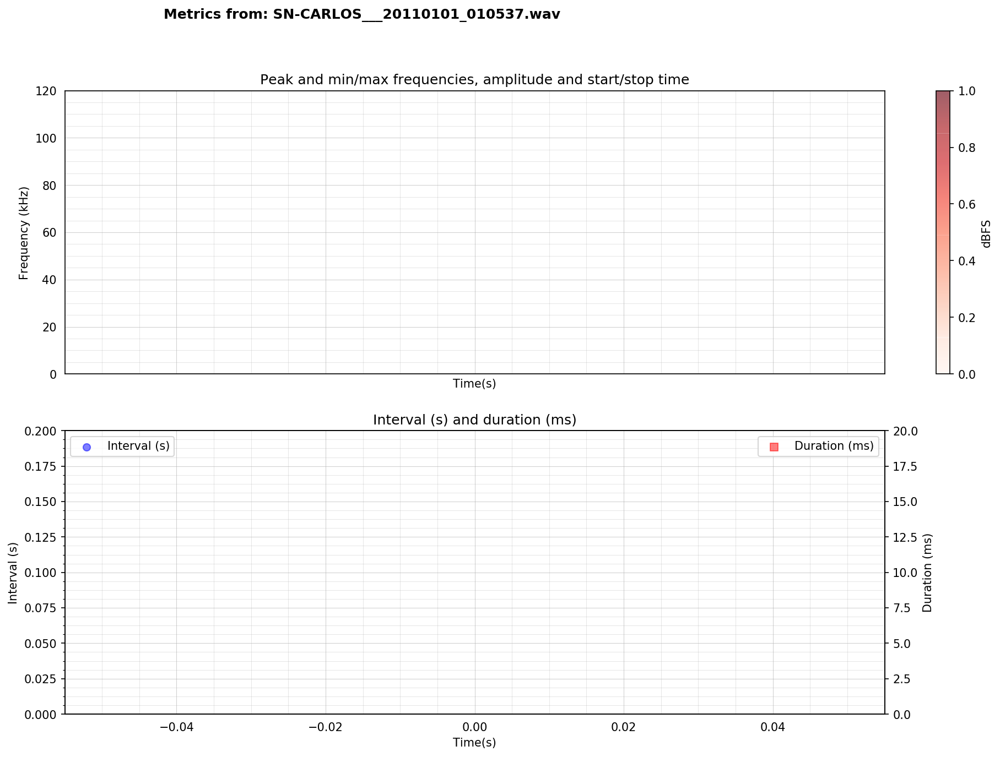

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010547.wav
Noise level:  0.00929    Noise (db):  -40.64
Detected peak counter: 0


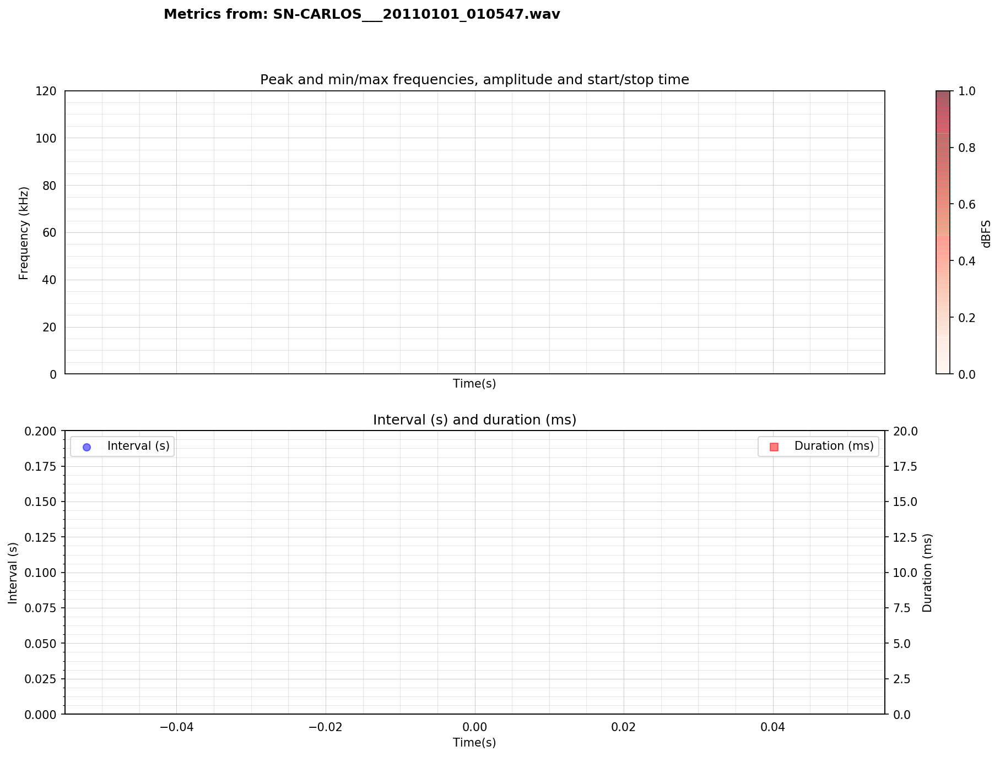

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010613.wav
Noise level:  0.01501    Noise (db):  -36.47
Detected peak counter: 21


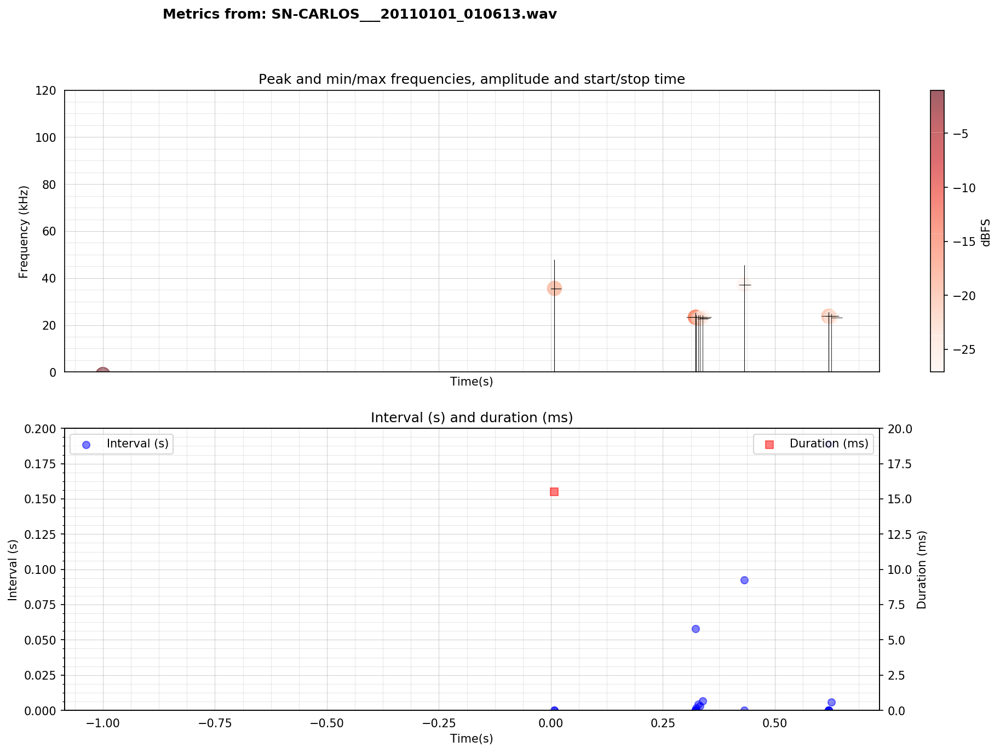

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010619.wav
Noise level:  0.0093    Noise (db):  -40.63
Detected peak counter: 0


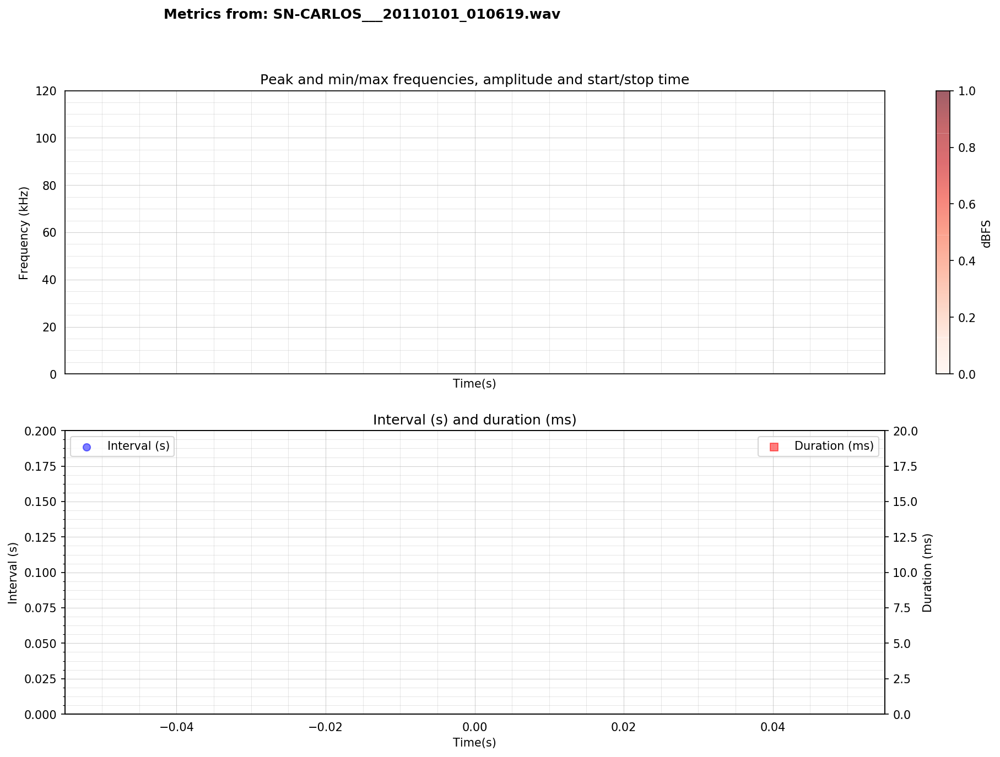

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010621.wav
Noise level:  0.01011    Noise (db):  -39.9
Noise level:  0.00916    Noise (db):  -40.77
Detected peak counter: 4


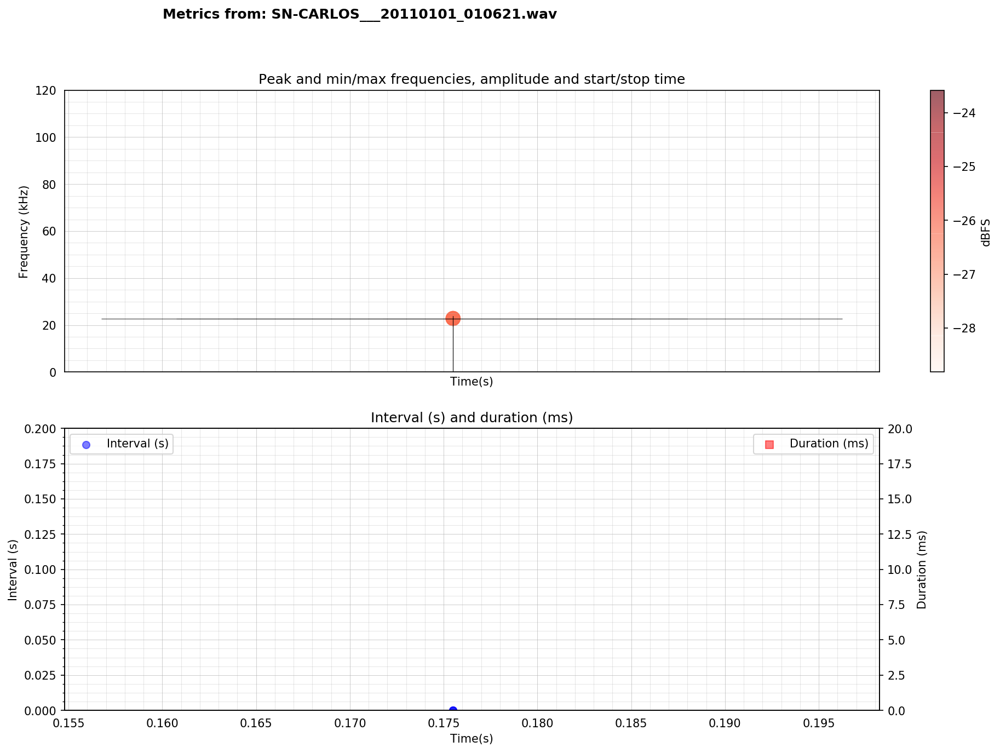

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010626.wav
Noise level:  0.00913    Noise (db):  -40.79
Detected peak counter: 0


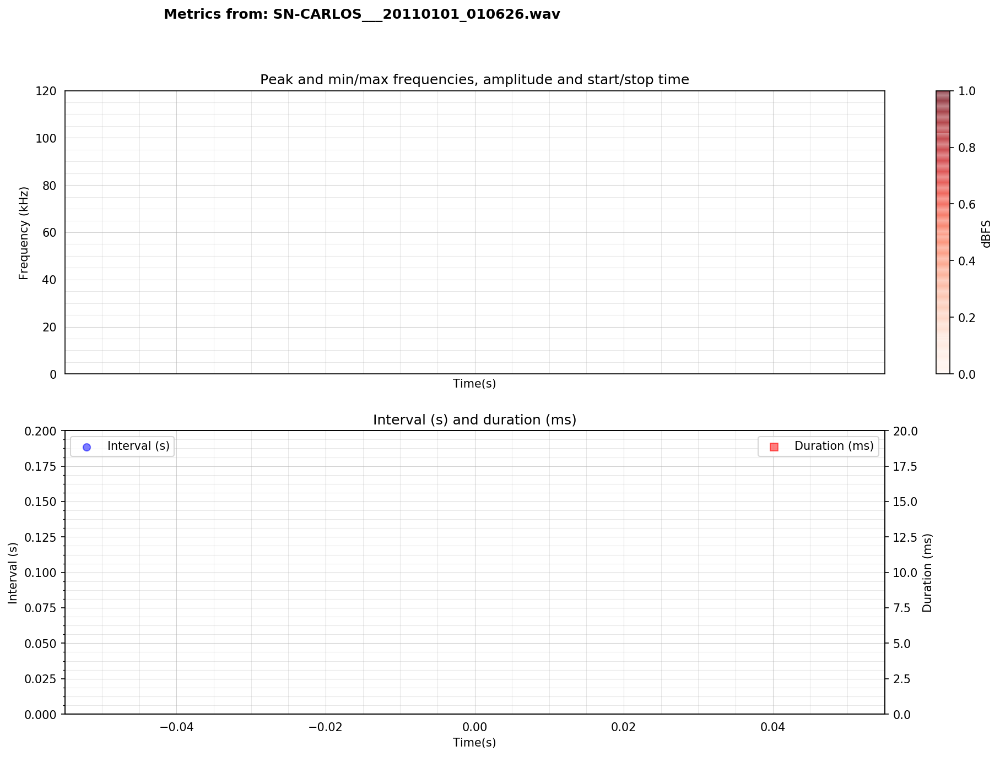

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010629.wav
Noise level:  0.01001    Noise (db):  -39.99
Detected peak counter: 2


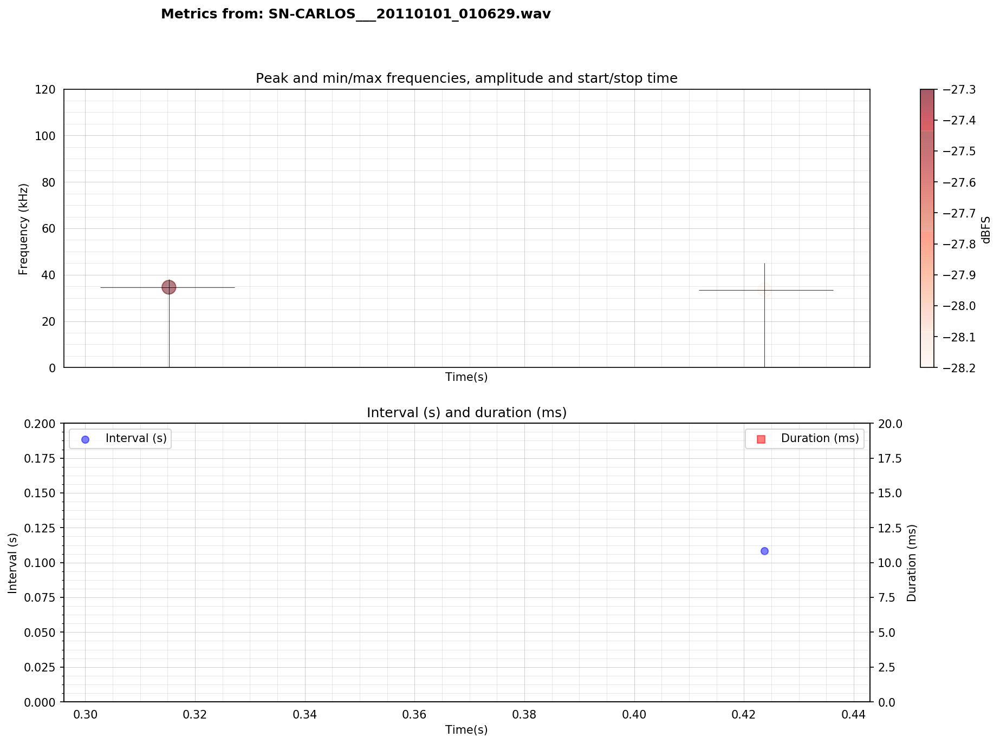

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010631.wav
Noise level:  0.03415    Noise (db):  -29.33
Detected peak counter: 10


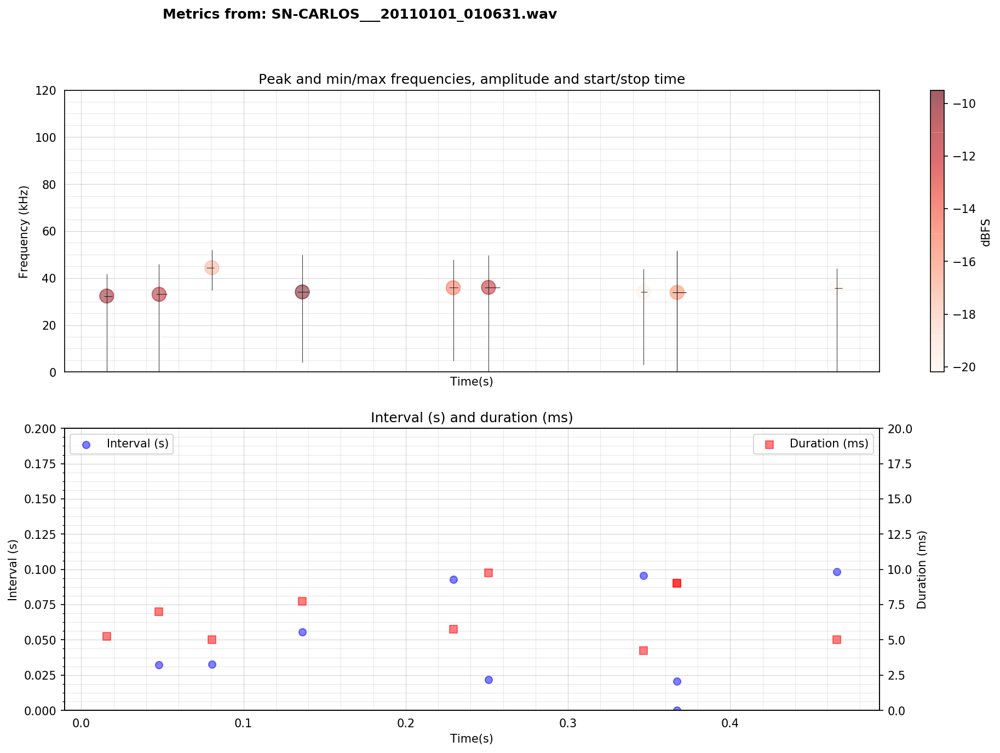

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010636.wav
Noise level:  0.03638    Noise (db):  -28.78
Noise level:  0.02569    Noise (db):  -31.81
Noise level:  0.00983    Noise (db):  -40.15
Detected peak counter: 20


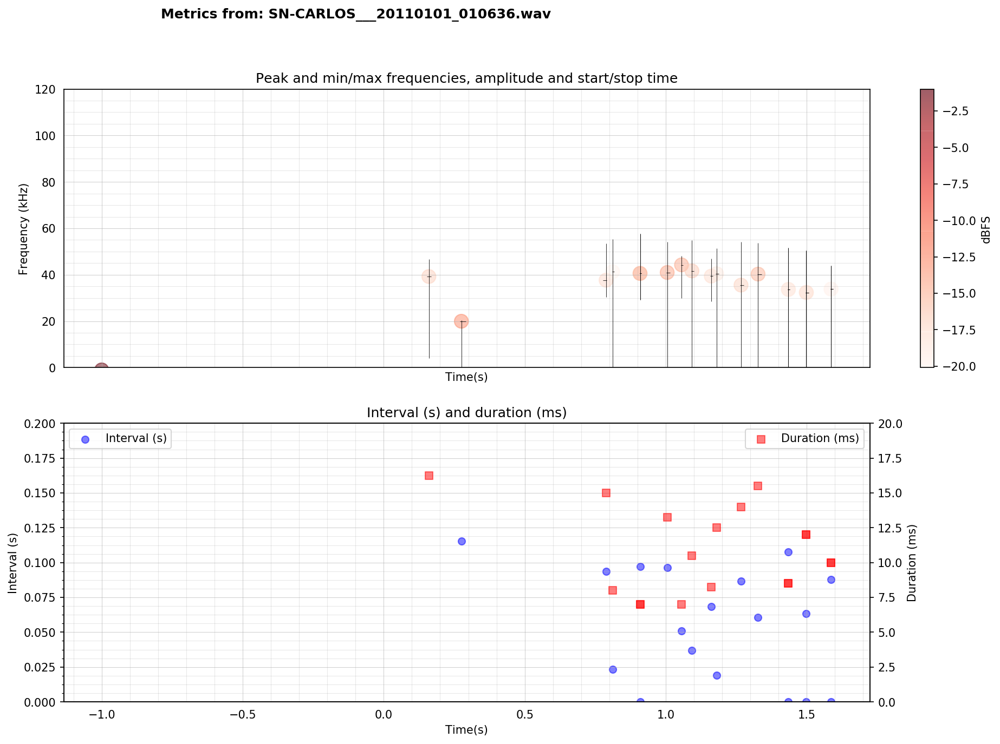

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010640.wav
Noise level:  0.0129    Noise (db):  -37.79
Noise level:  0.01894    Noise (db):  -34.45
Noise level:  0.01308    Noise (db):  -37.67
Detected peak counter: 8


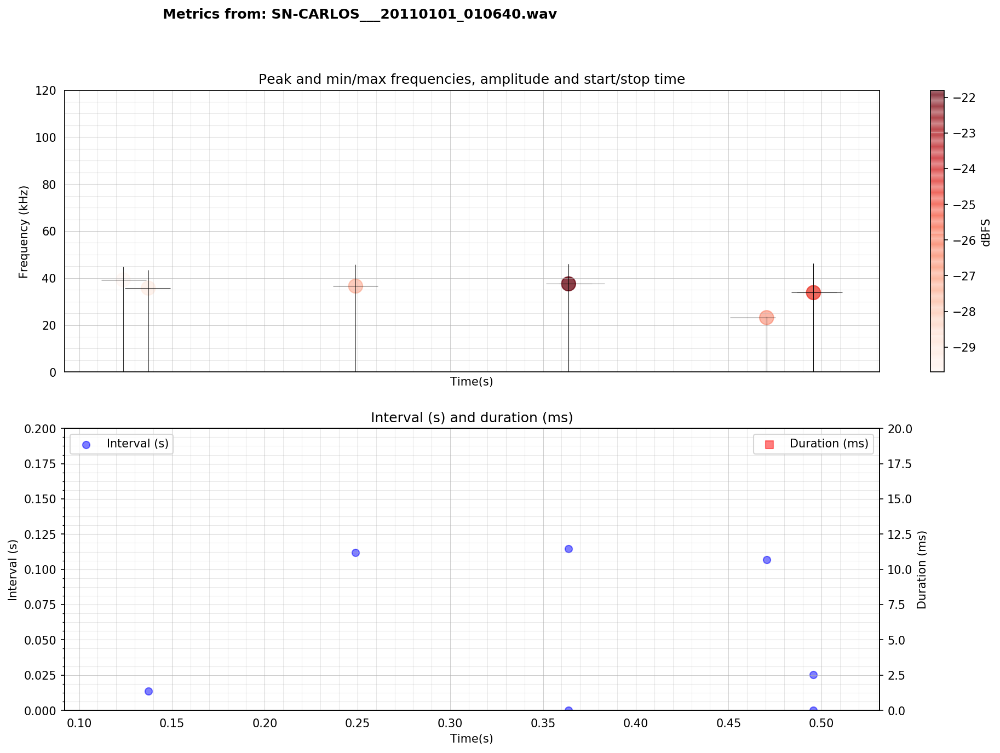

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010651.wav
Noise level:  0.01656    Noise (db):  -35.62
Detected peak counter: 6


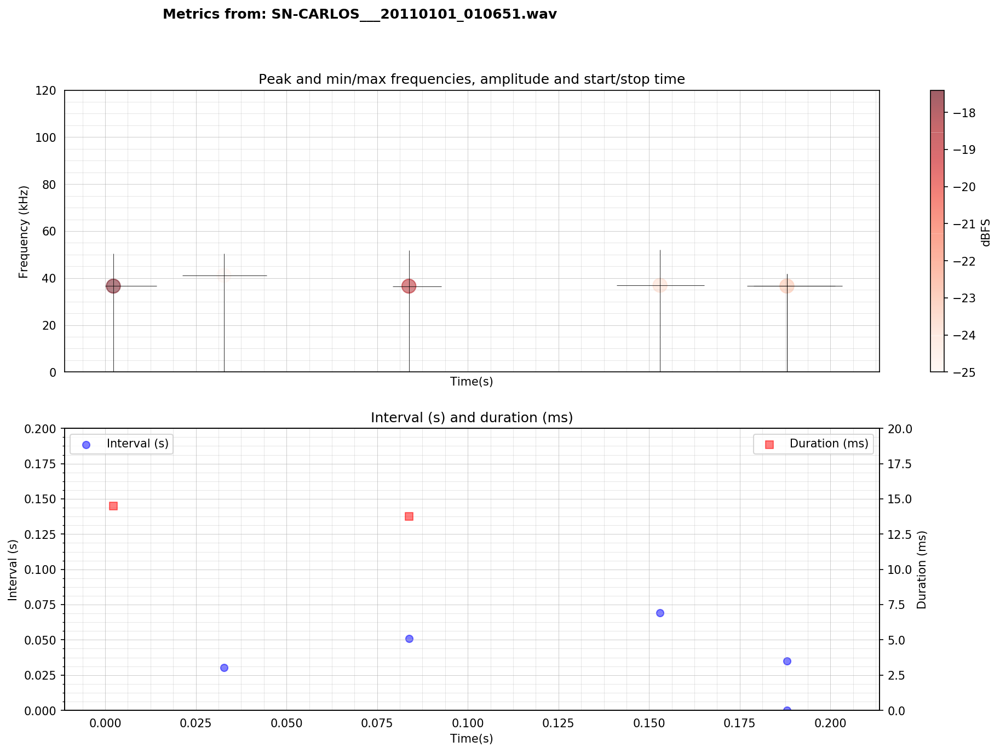

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010654.wav
Noise level:  0.0093    Noise (db):  -40.63
Detected peak counter: 0


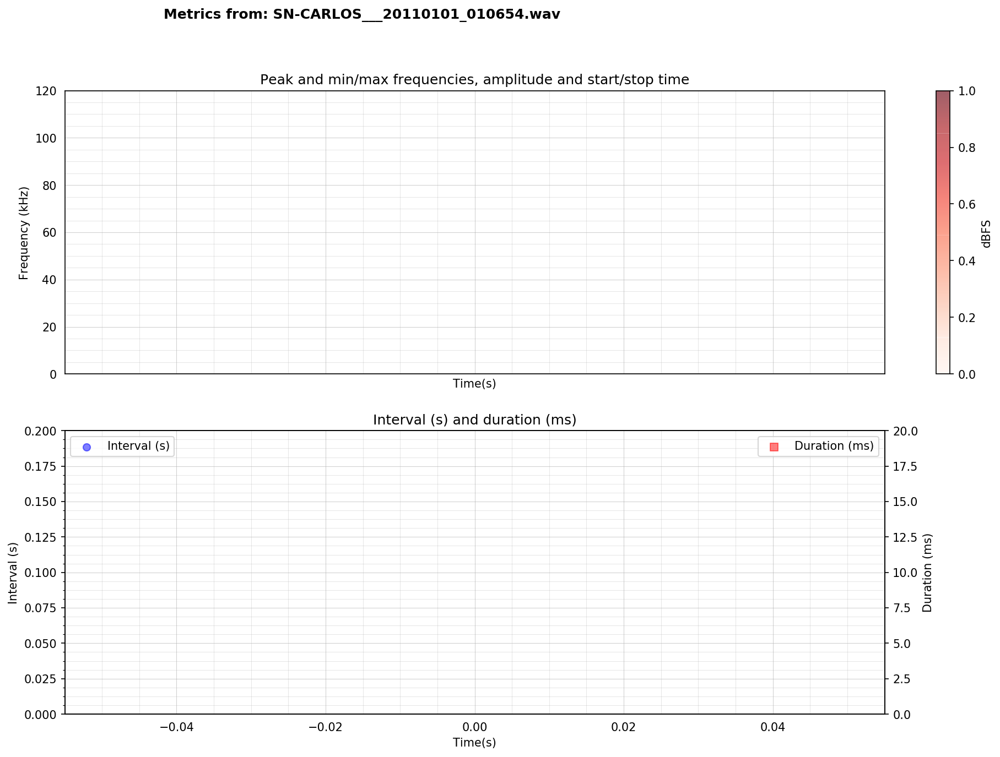

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010657.wav
Noise level:  0.01304    Noise (db):  -37.69
Detected peak counter: 4


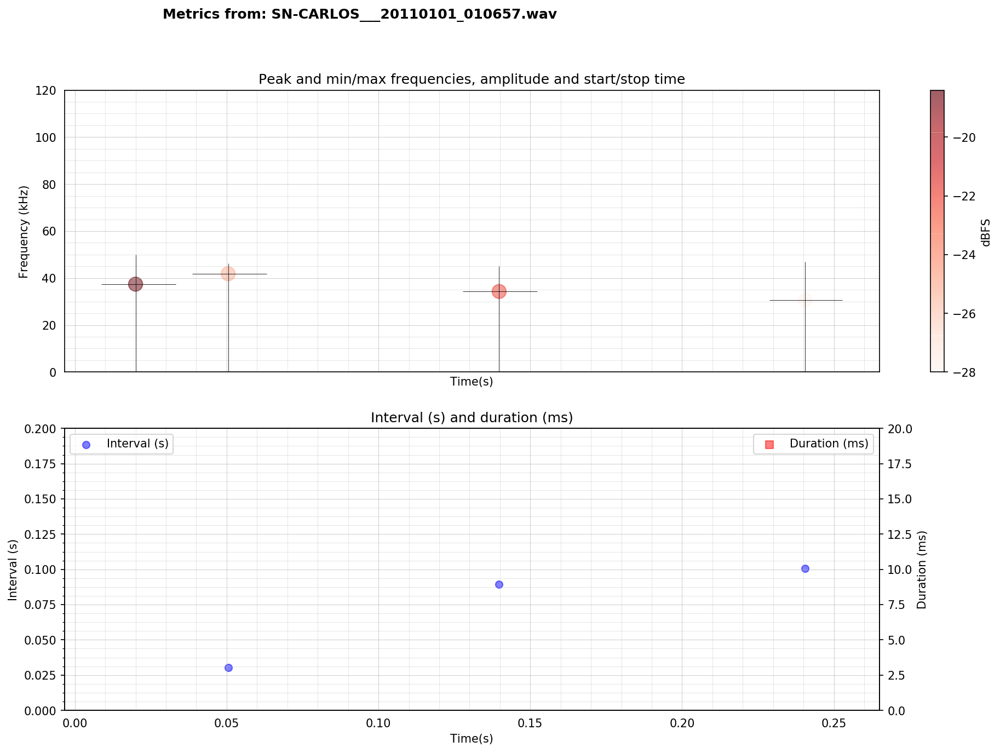

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010700.wav
Noise level:  0.03877    Noise (db):  -28.23
Detected peak counter: 0


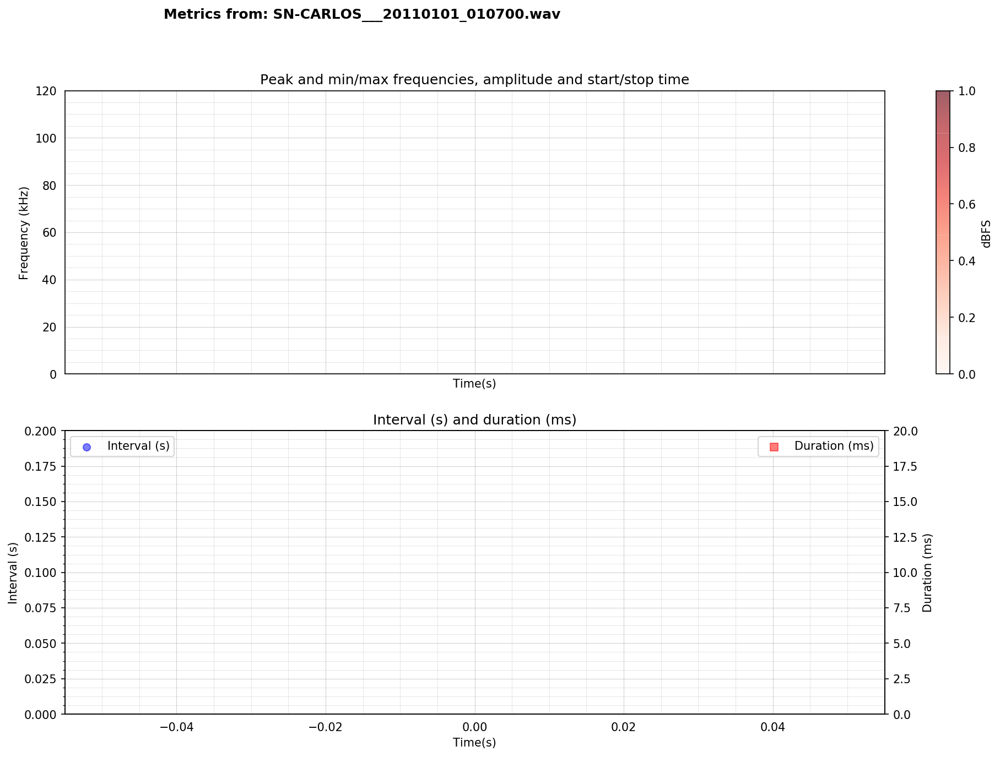

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010706.wav
Noise level:  0.08565    Noise (db):  -21.35
Noise level:  0.03793    Noise (db):  -28.42
Detected peak counter: 0


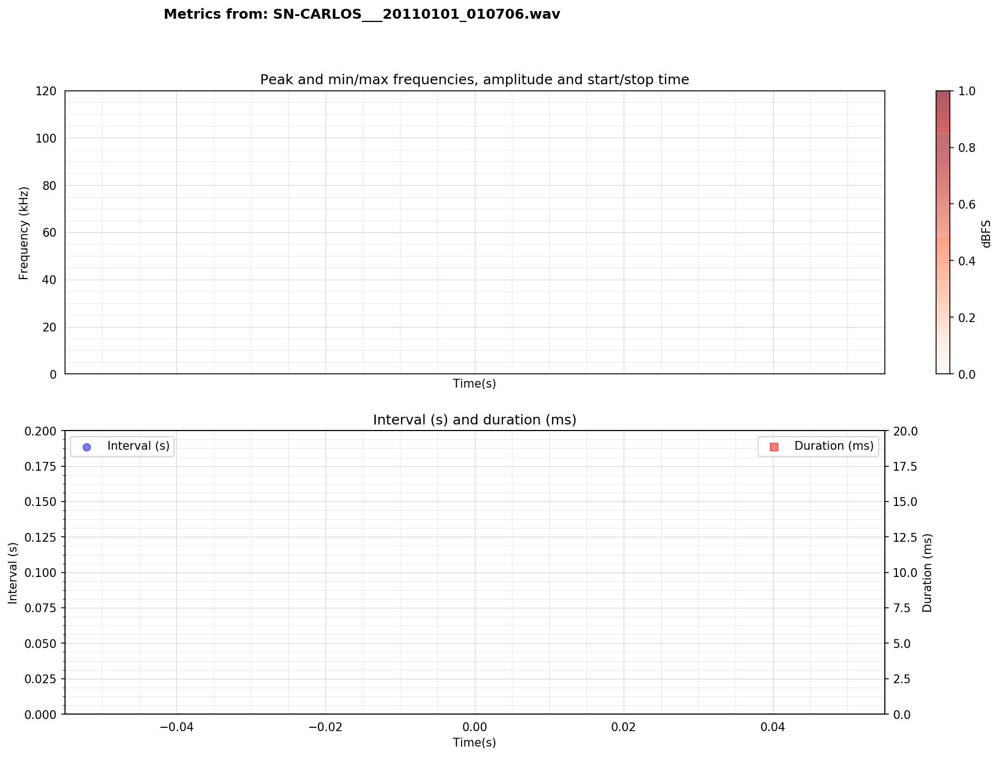

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010711.wav
Noise level:  0.01446    Noise (db):  -36.8
Detected peak counter: 5


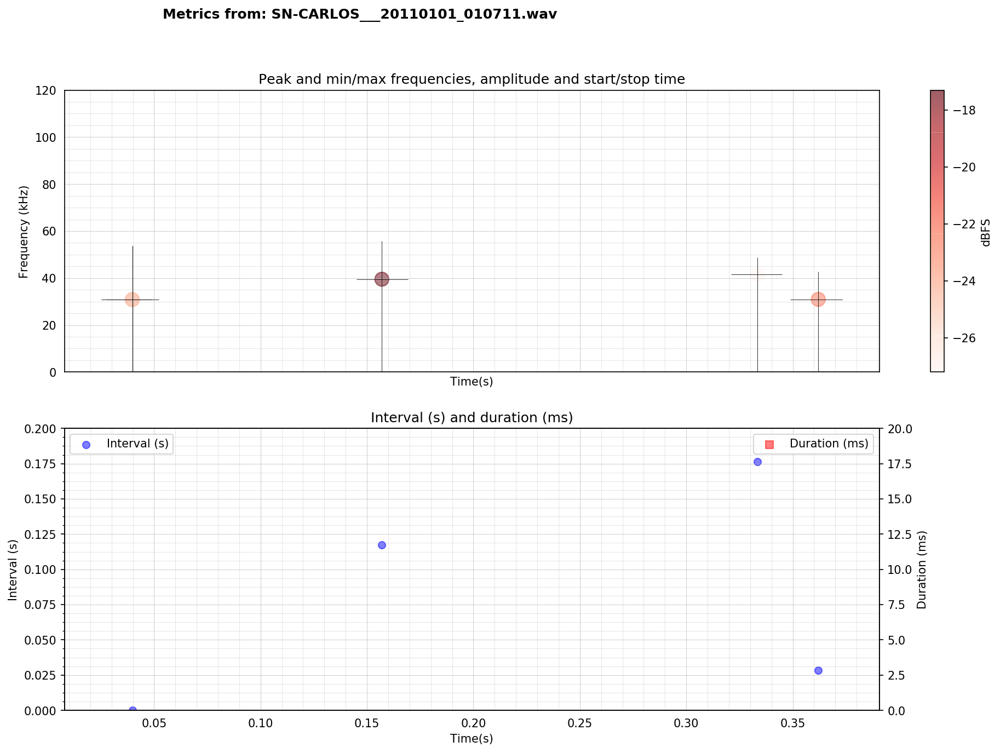

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010713.wav
Noise level:  0.01626    Noise (db):  -35.78
Detected peak counter: 15


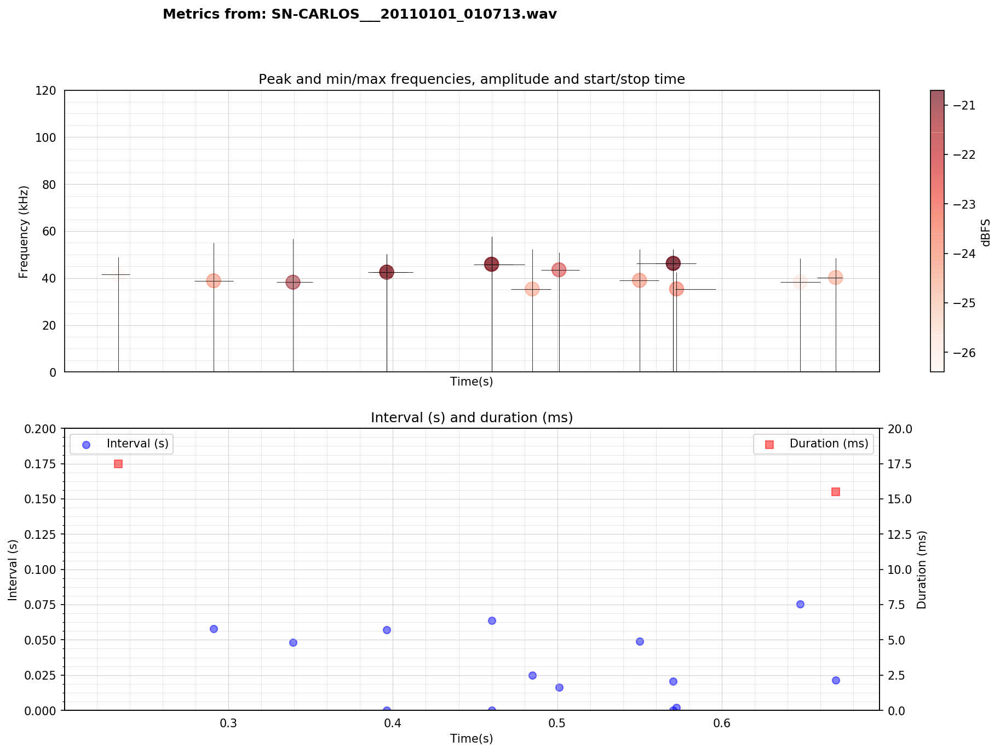

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010720.wav
Noise level:  0.0261    Noise (db):  -31.67
Noise level:  0.00918    Noise (db):  -40.75
Detected peak counter: 9


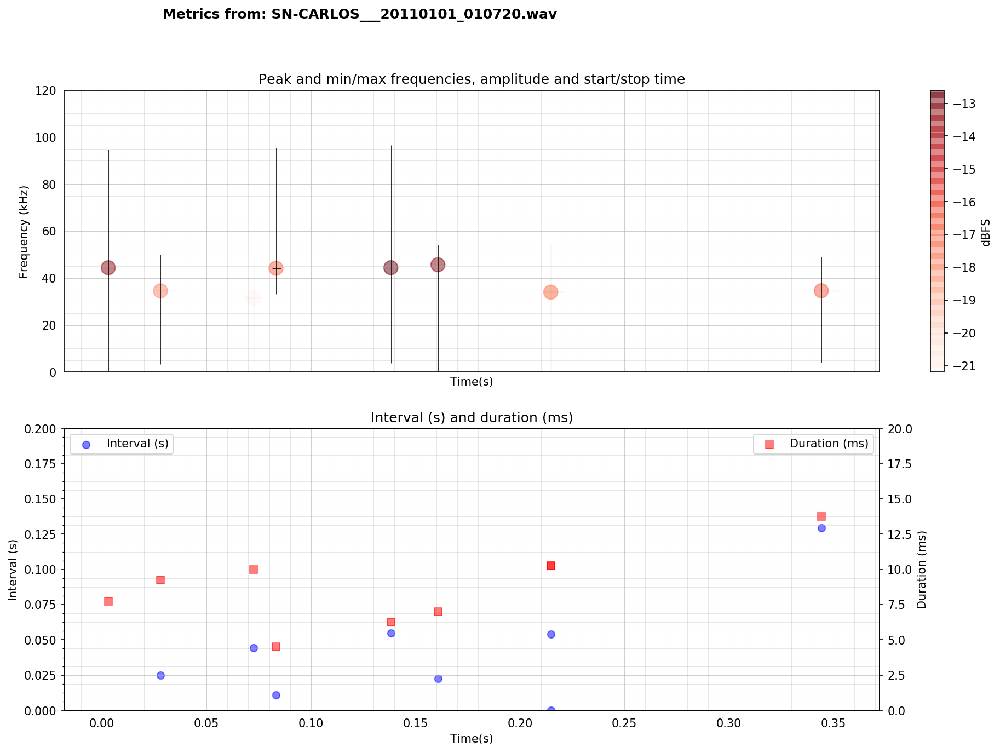

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010723.wav
Noise level:  0.01265    Noise (db):  -37.96
Noise level:  0.00892    Noise (db):  -41.0
Detected peak counter: 6


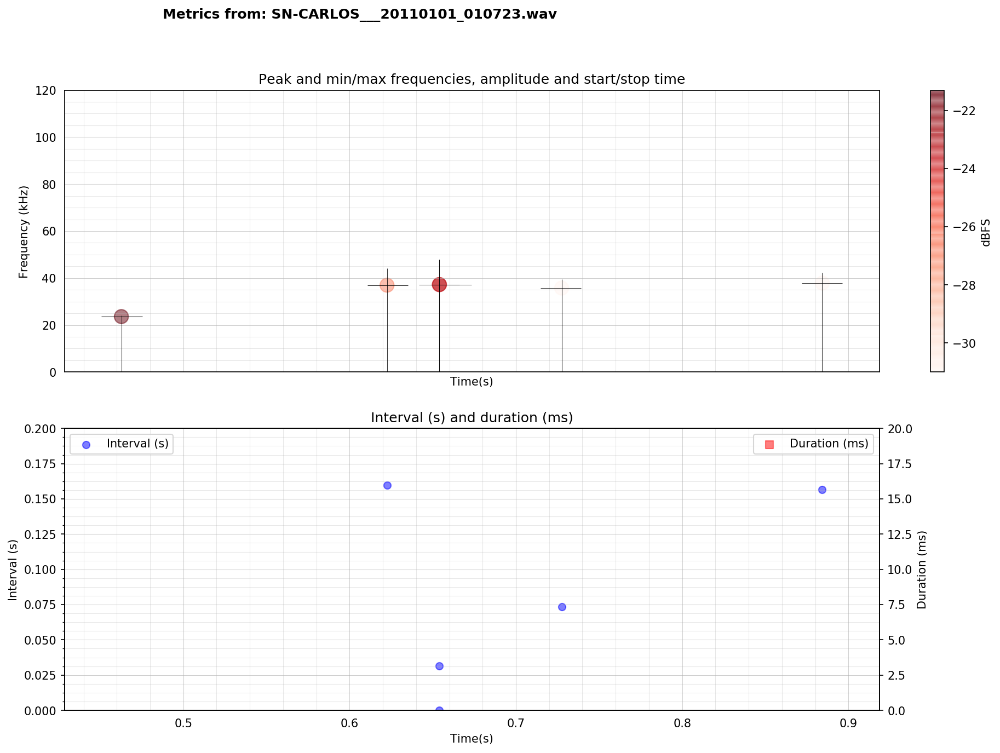

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010726.wav
Noise level:  0.03115    Noise (db):  -30.13
Noise level:  0.03113    Noise (db):  -30.14
Detected peak counter: 16


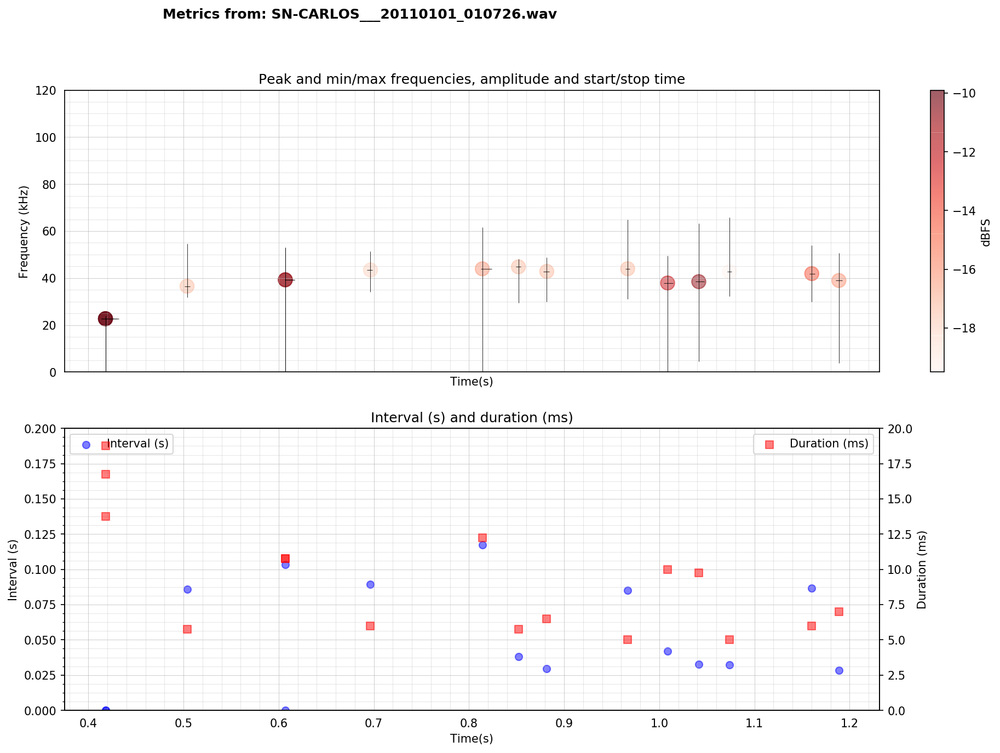

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010729.wav
Noise level:  0.00914    Noise (db):  -40.78
Detected peak counter: 0


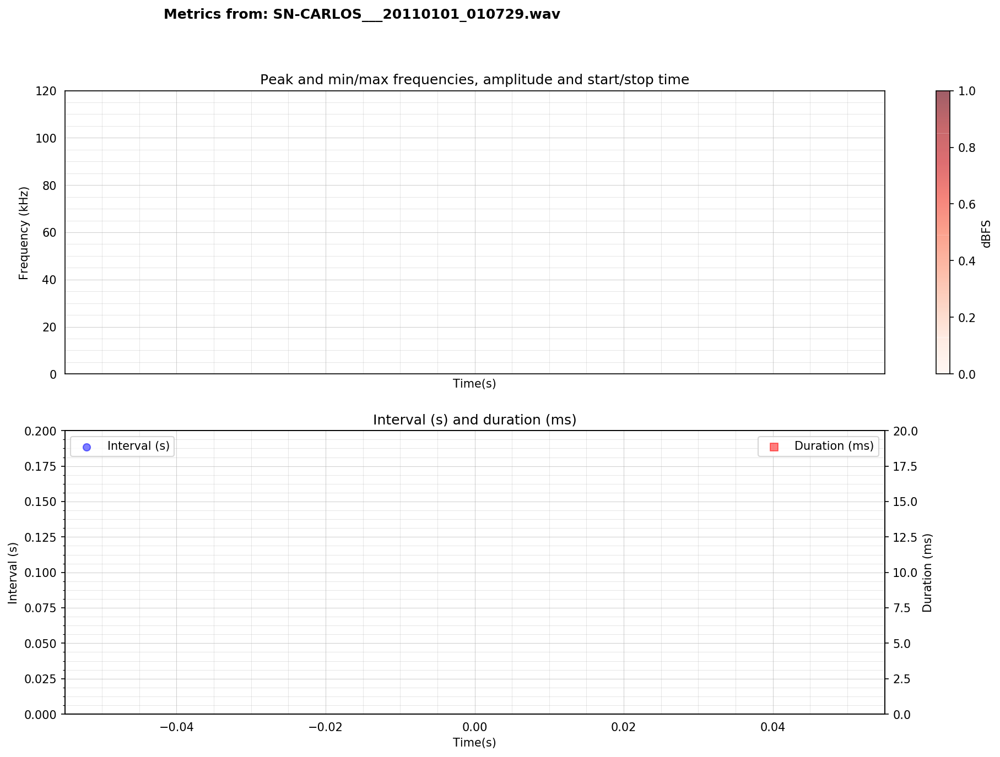

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010737.wav
Noise level:  0.00908    Noise (db):  -40.84
Detected peak counter: 0


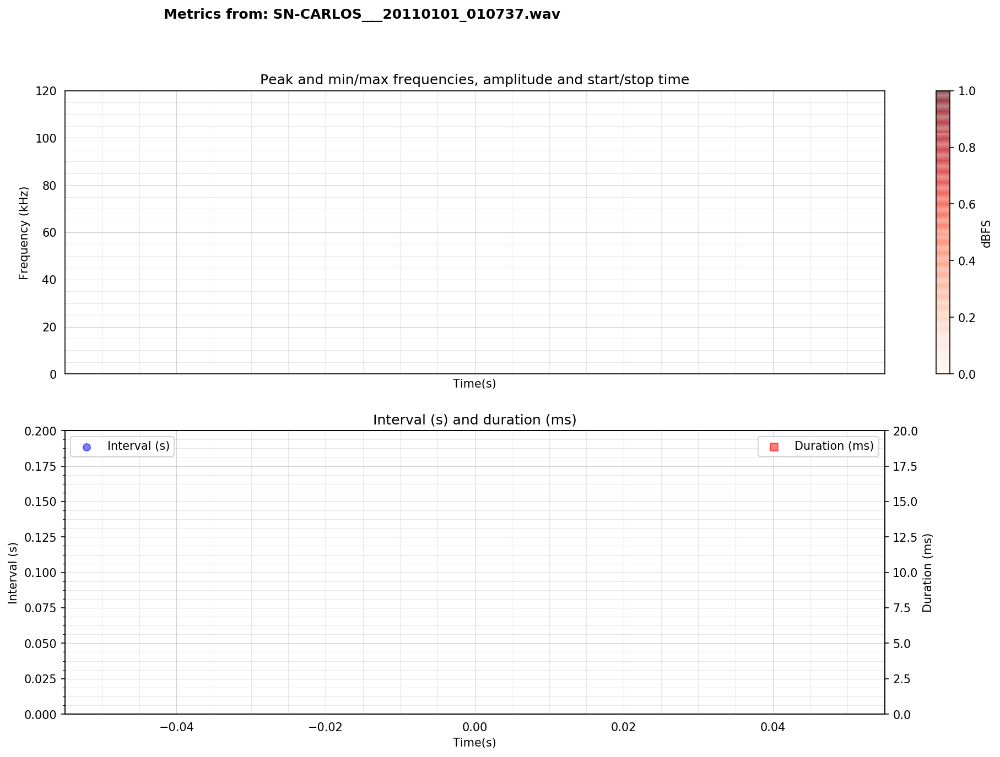

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010739.wav
Noise level:  0.01253    Noise (db):  -38.04
Noise level:  0.01089    Noise (db):  -39.26
Noise level:  0.01588    Noise (db):  -35.98
Noise level:  0.01124    Noise (db):  -38.98


..\dsp4bats\frequency_domain_utils.py:87: RuntimeWarning: divide by zero encountered in log10


Noise level:  0.01175    Noise (db):  -38.6
Detected peak counter: 29


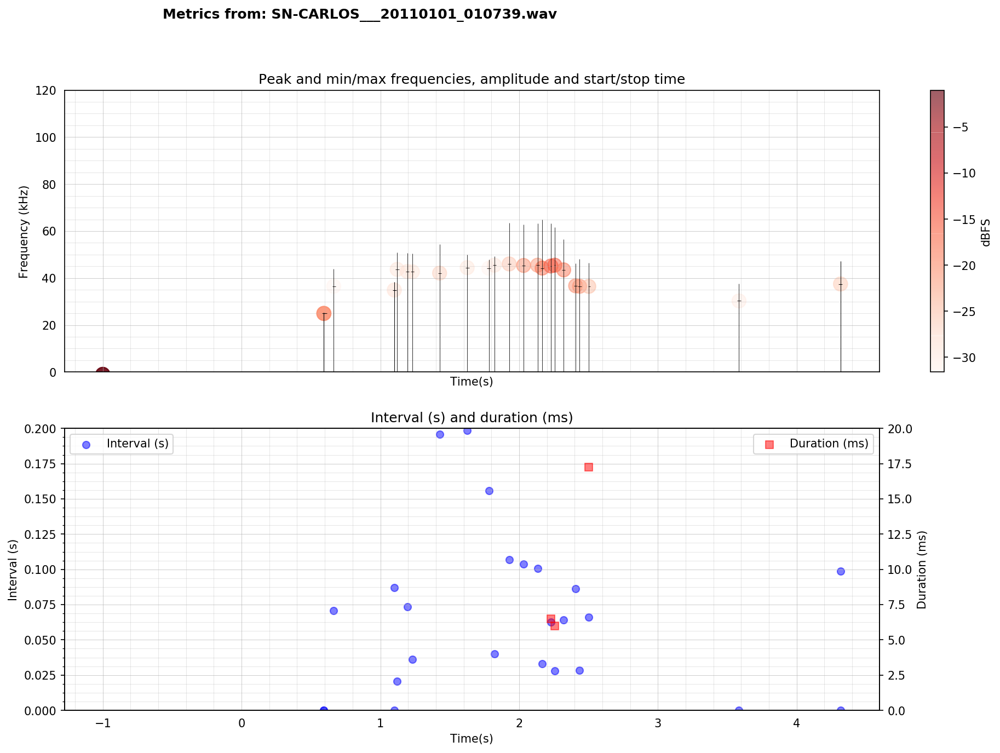

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010744.wav
Noise level:  0.01142    Noise (db):  -38.84
Noise level:  0.01375    Noise (db):  -37.23
Noise level:  0.01065    Noise (db):  -39.45
Detected peak counter: 12


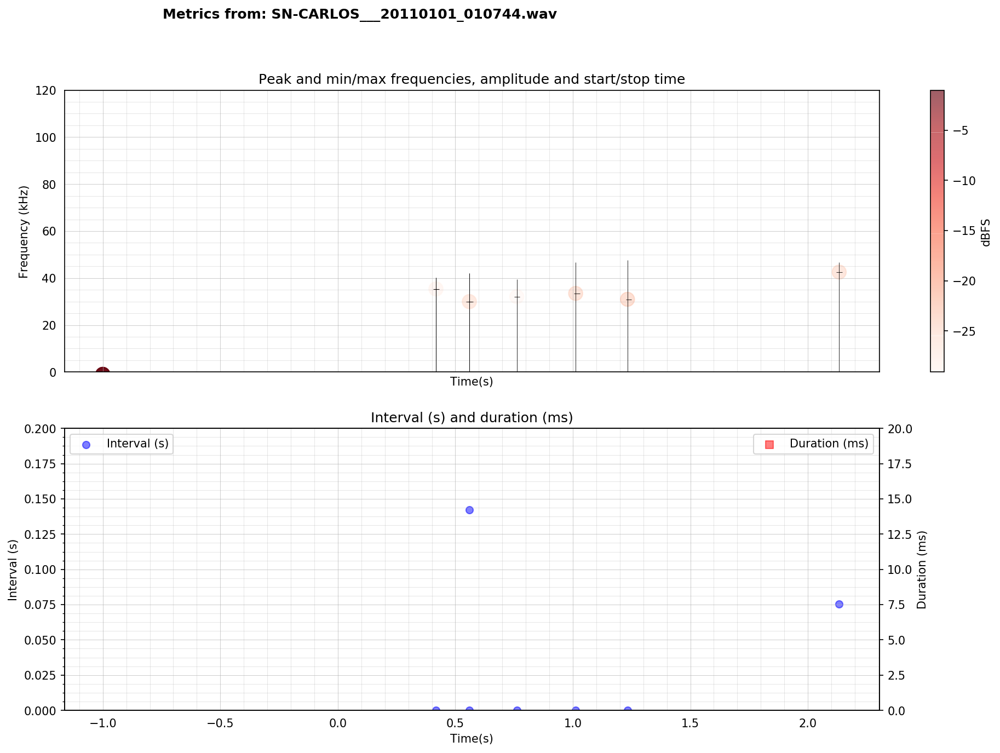

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010748.wav
Noise level:  0.01085    Noise (db):  -39.3
Noise level:  0.01212    Noise (db):  -38.33
Detected peak counter: 14


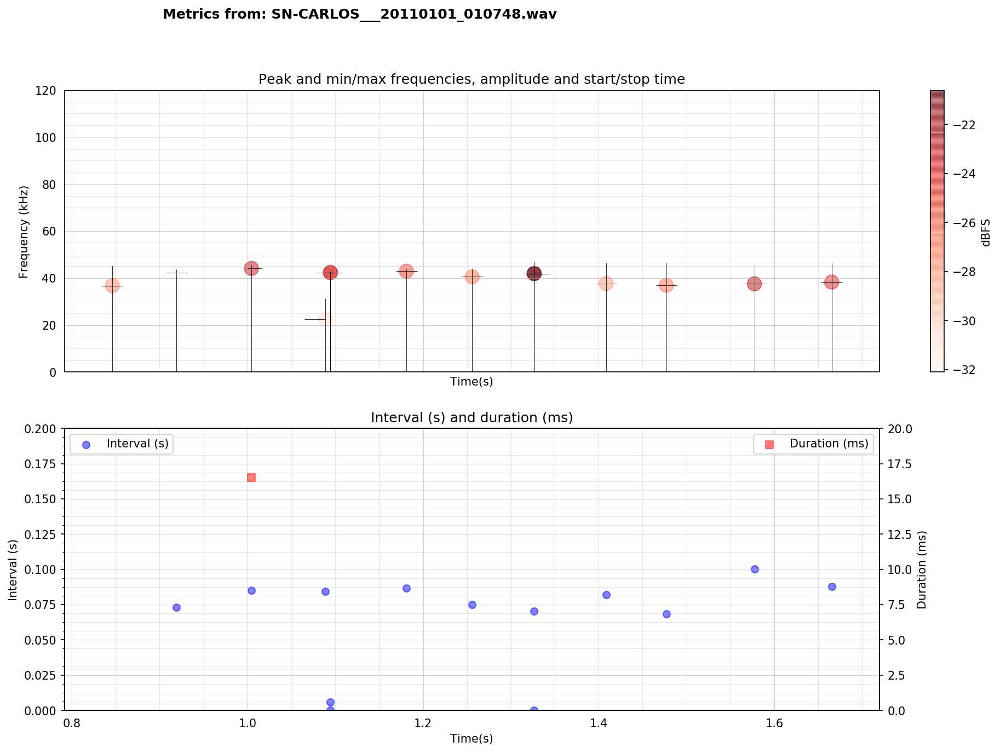

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010801.wav
Noise level:  0.00899    Noise (db):  -40.92
Detected peak counter: 0


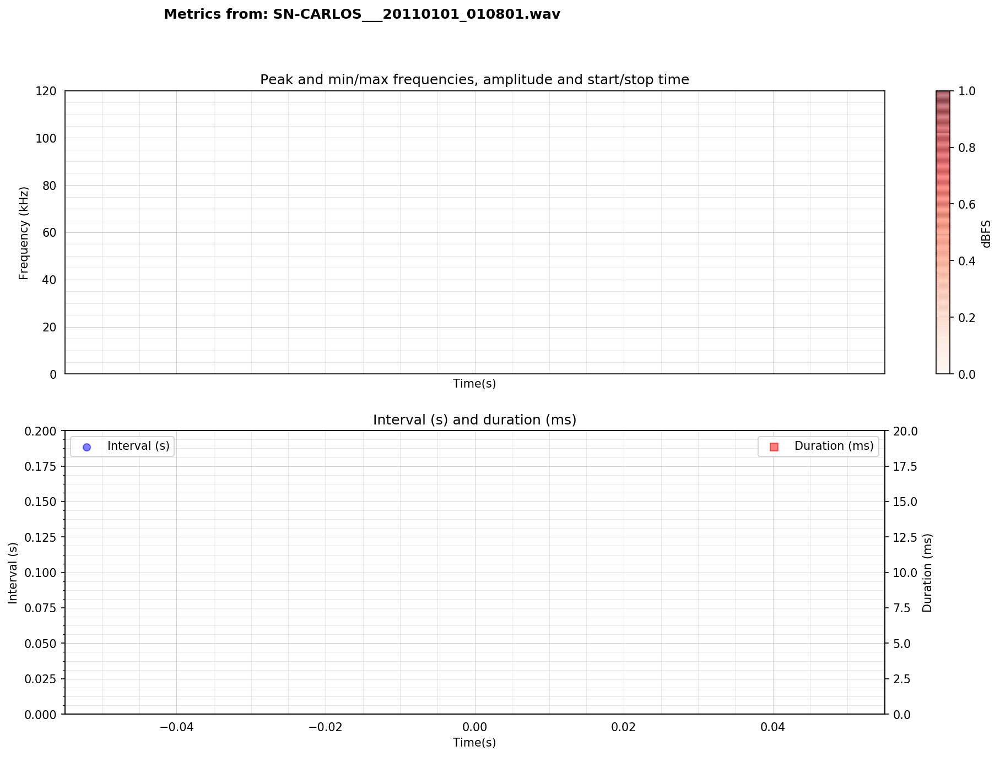

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010803.wav
Noise level:  0.01152    Noise (db):  -38.77
Noise level:  0.01161    Noise (db):  -38.71
Detected peak counter: 2


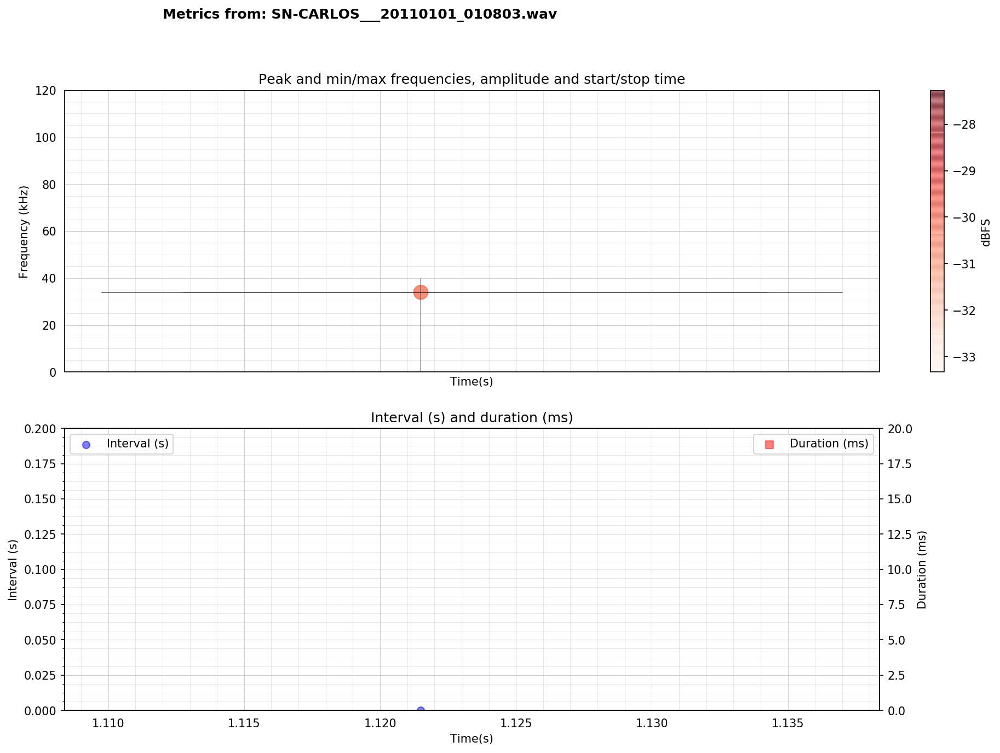

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010807.wav
Noise level:  0.00991    Noise (db):  -40.08
Detected peak counter: 3


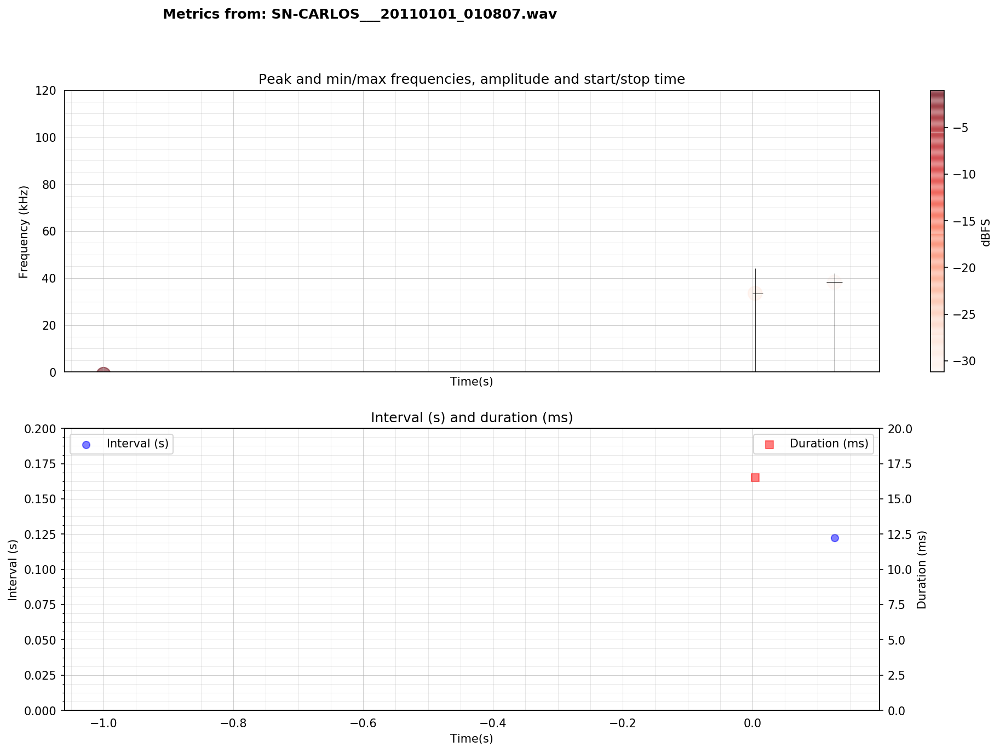

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010846.wav
Noise level:  0.01134    Noise (db):  -38.91
Noise level:  0.01085    Noise (db):  -39.29
Detected peak counter: 23


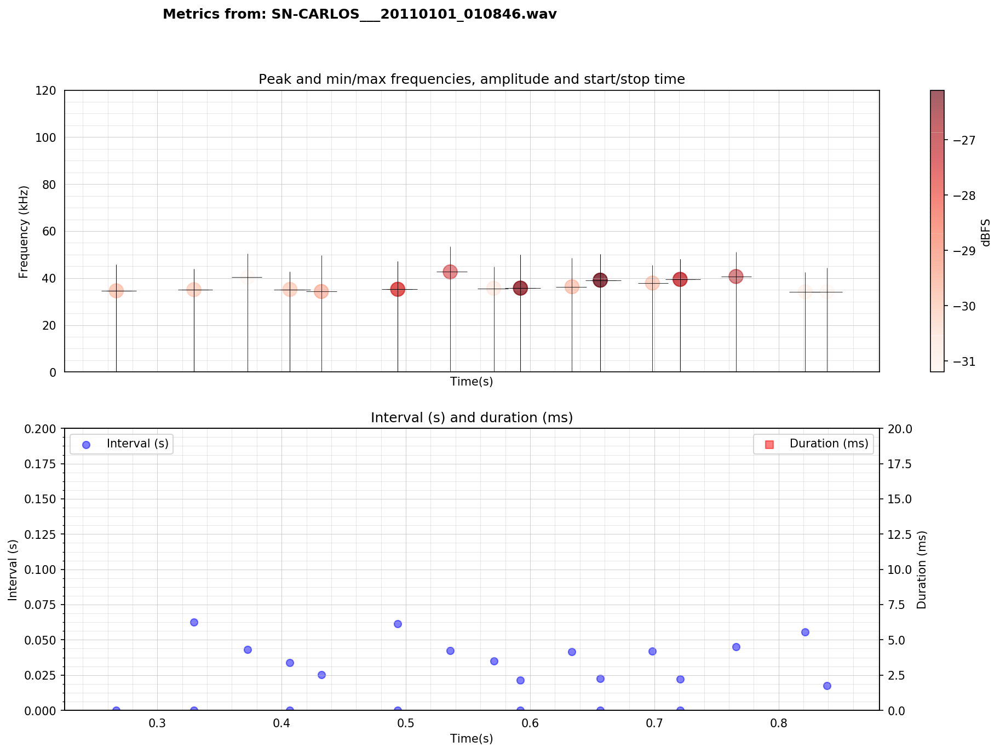

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010850.wav
Noise level:  0.01703    Noise (db):  -35.38
Noise level:  0.01421    Noise (db):  -36.95
Detected peak counter: 40


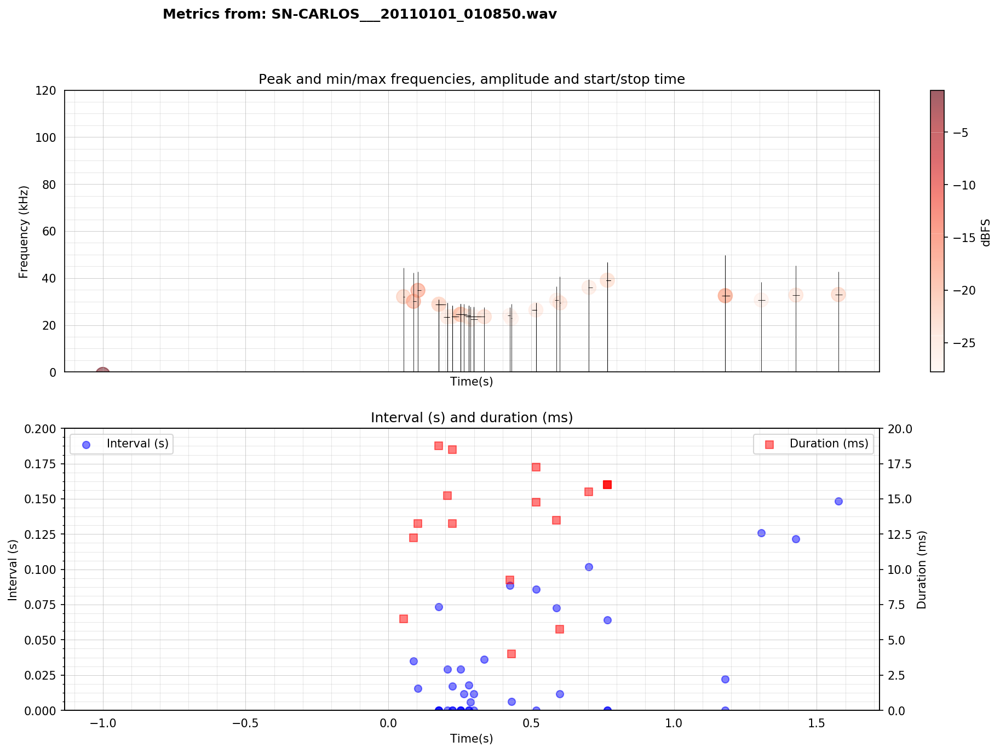

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010853.wav
Noise level:  0.01886    Noise (db):  -34.49
Detected peak counter: 10


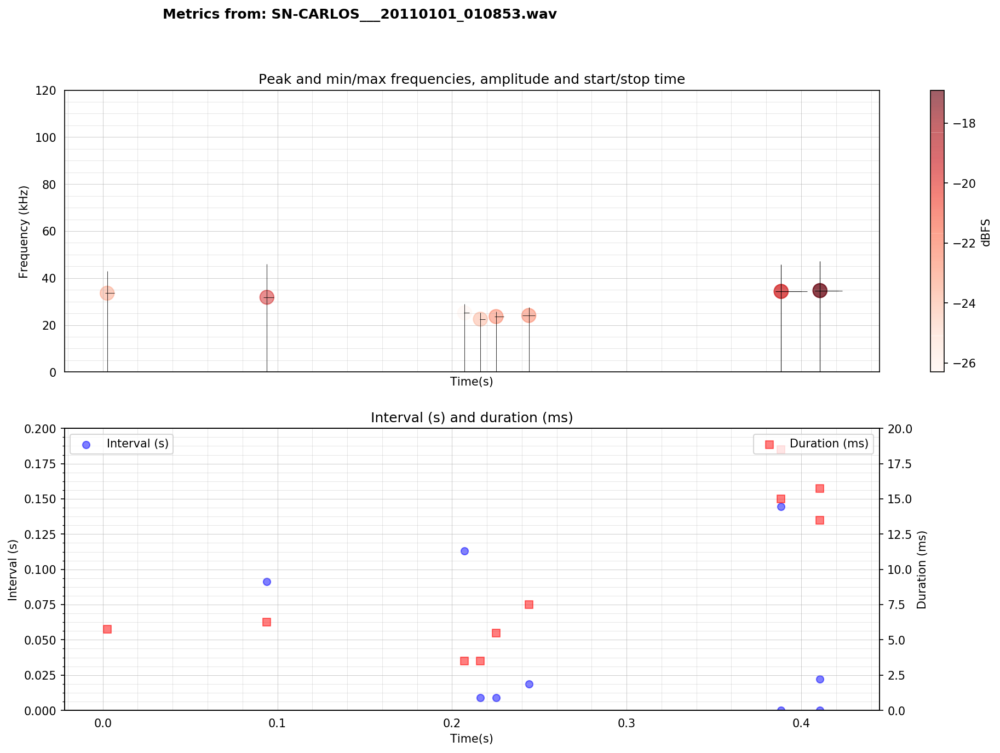

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010940.wav
Noise level:  0.00902    Noise (db):  -40.89
Detected peak counter: 0


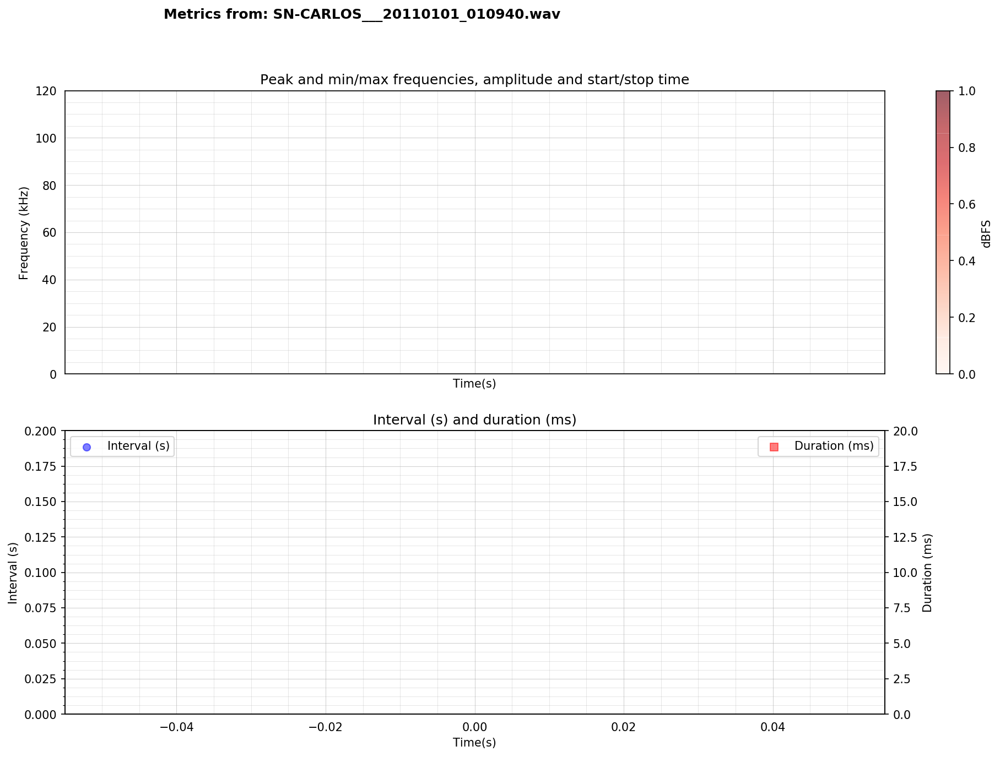

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_010959.wav
Noise level:  0.00944    Noise (db):  -40.5
Detected peak counter: 0


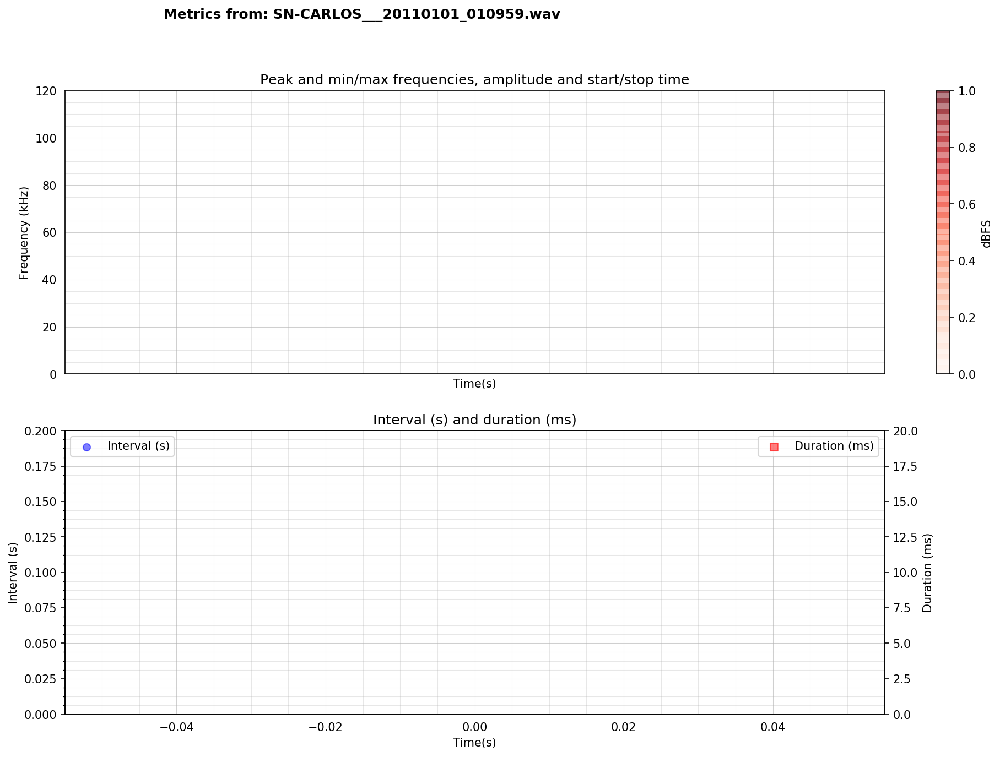

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011044.wav
Noise level:  0.01121    Noise (db):  -39.01
Detected peak counter: 2


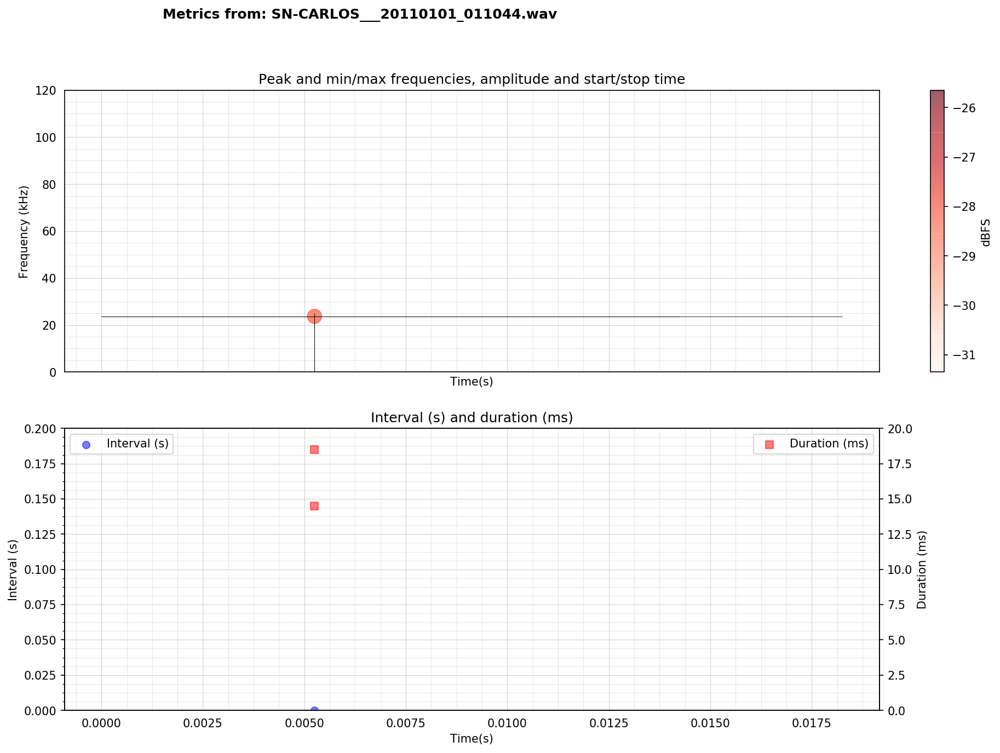

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011100.wav
Noise level:  0.00915    Noise (db):  -40.77
Detected peak counter: 0


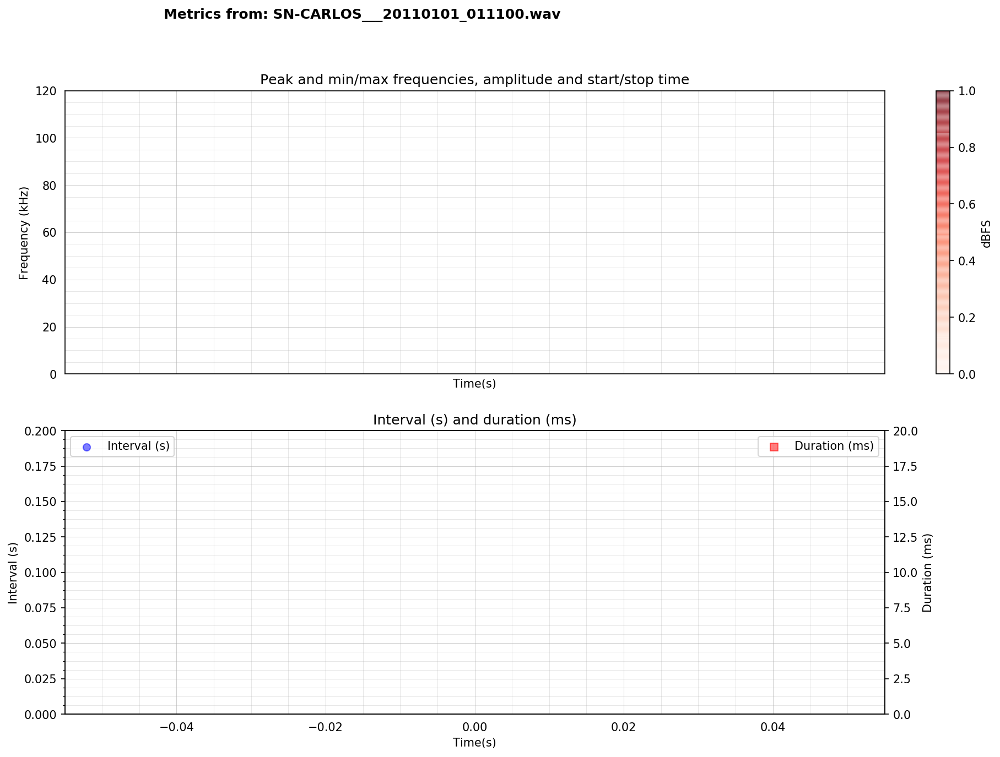

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011117.wav
Noise level:  0.00952    Noise (db):  -40.42
Detected peak counter: 0


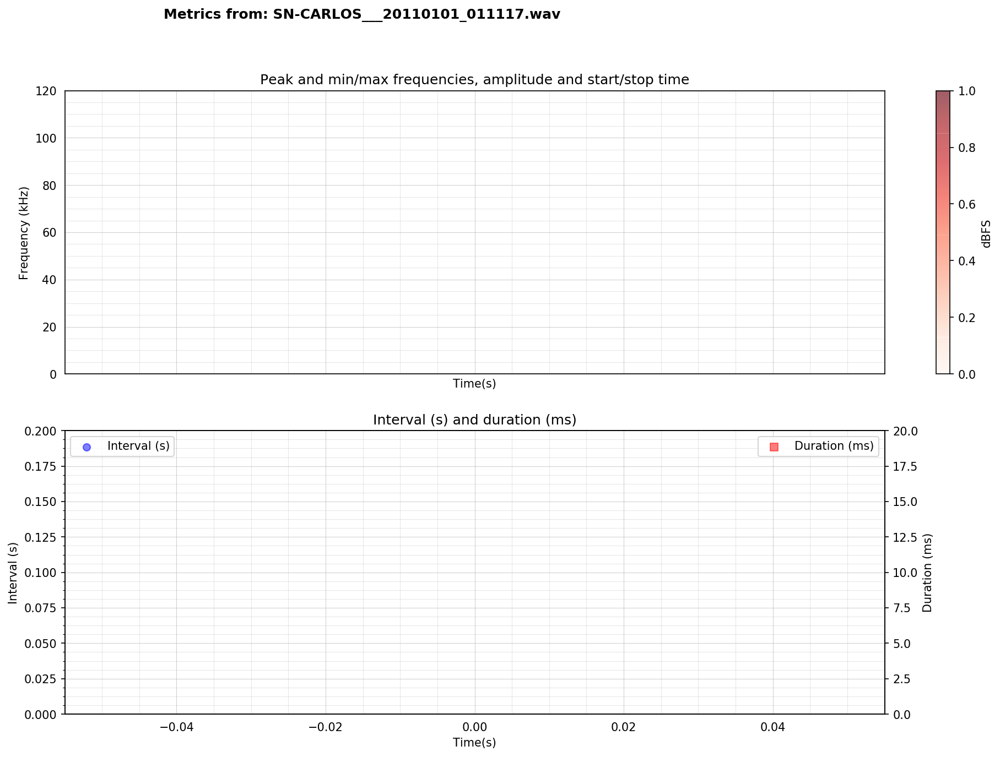

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011118.wav
Noise level:  0.01137    Noise (db):  -38.88
Detected peak counter: 1


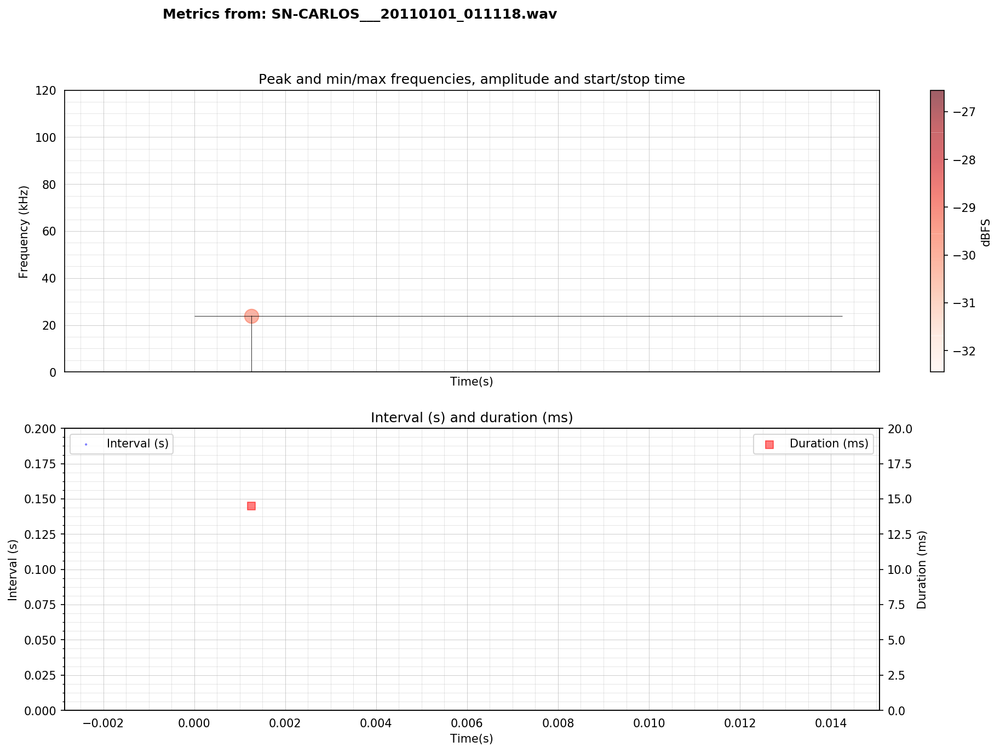

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011212.wav
Noise level:  0.00907    Noise (db):  -40.85
Detected peak counter: 0


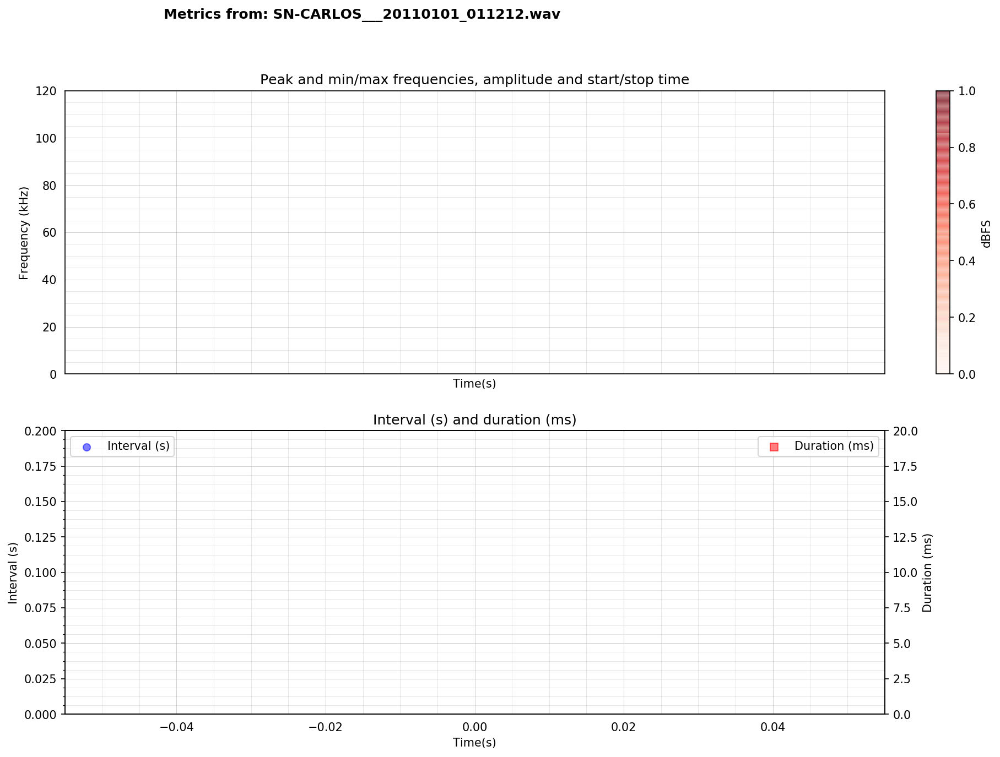

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011328.wav
Noise level:  0.00982    Noise (db):  -40.15
Detected peak counter: 0


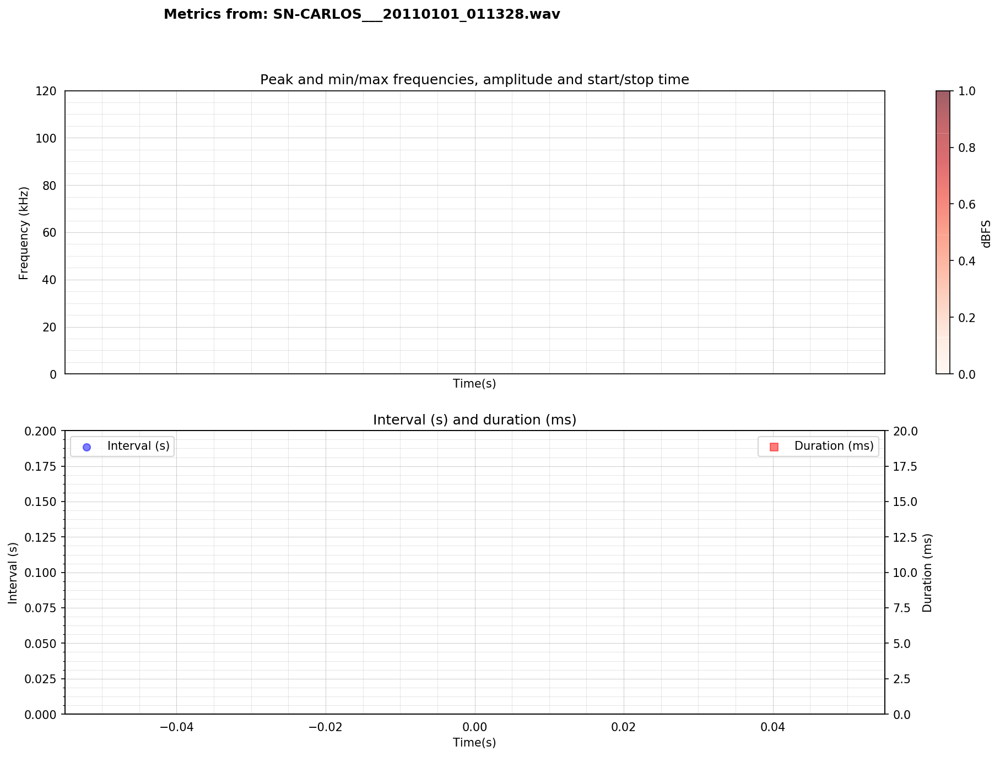

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011504.wav
Noise level:  0.01142    Noise (db):  -38.84
Detected peak counter: 0


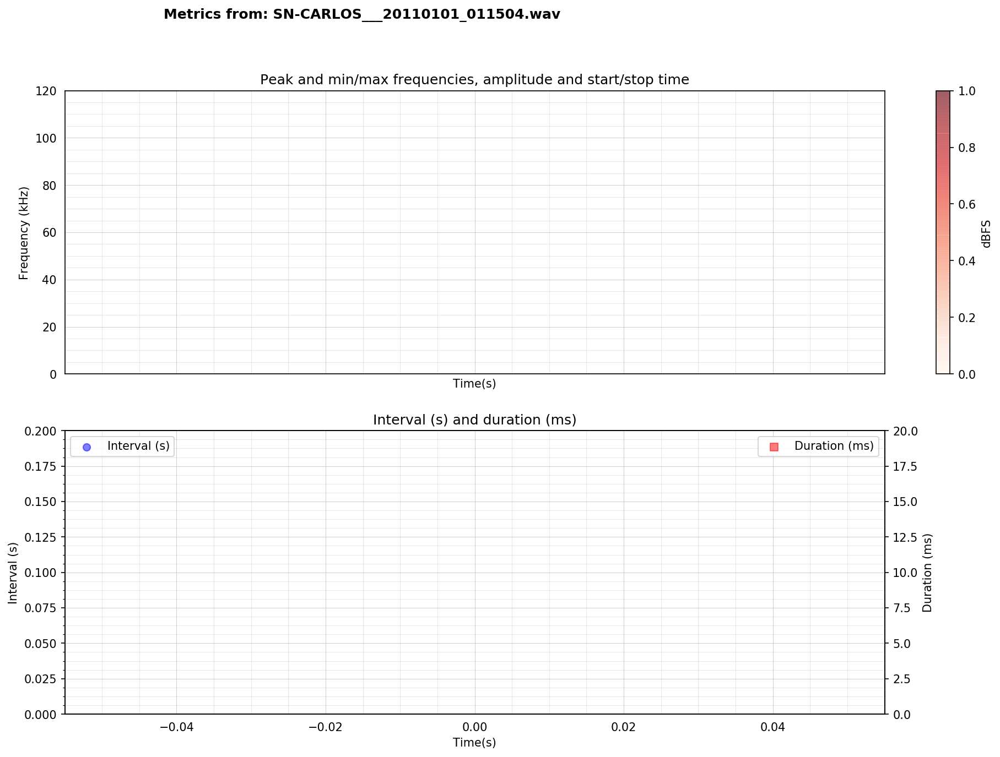

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011615.wav
Noise level:  0.00899    Noise (db):  -40.93
Detected peak counter: 0


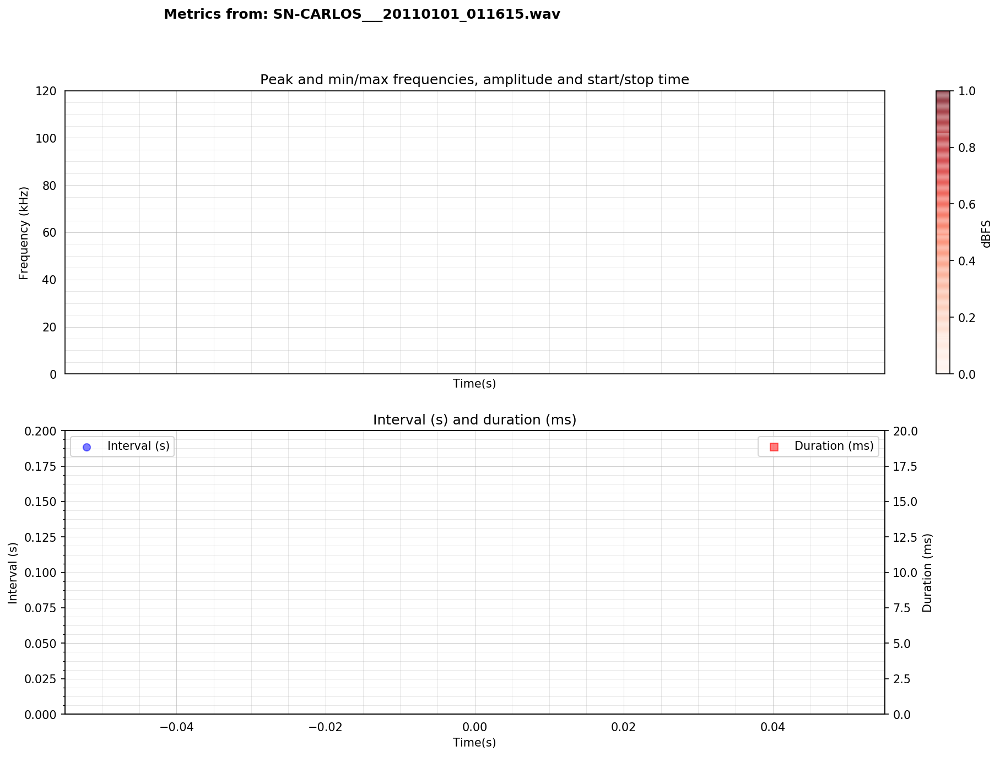

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011714.wav
Noise level:  0.00898    Noise (db):  -40.93
Detected peak counter: 0


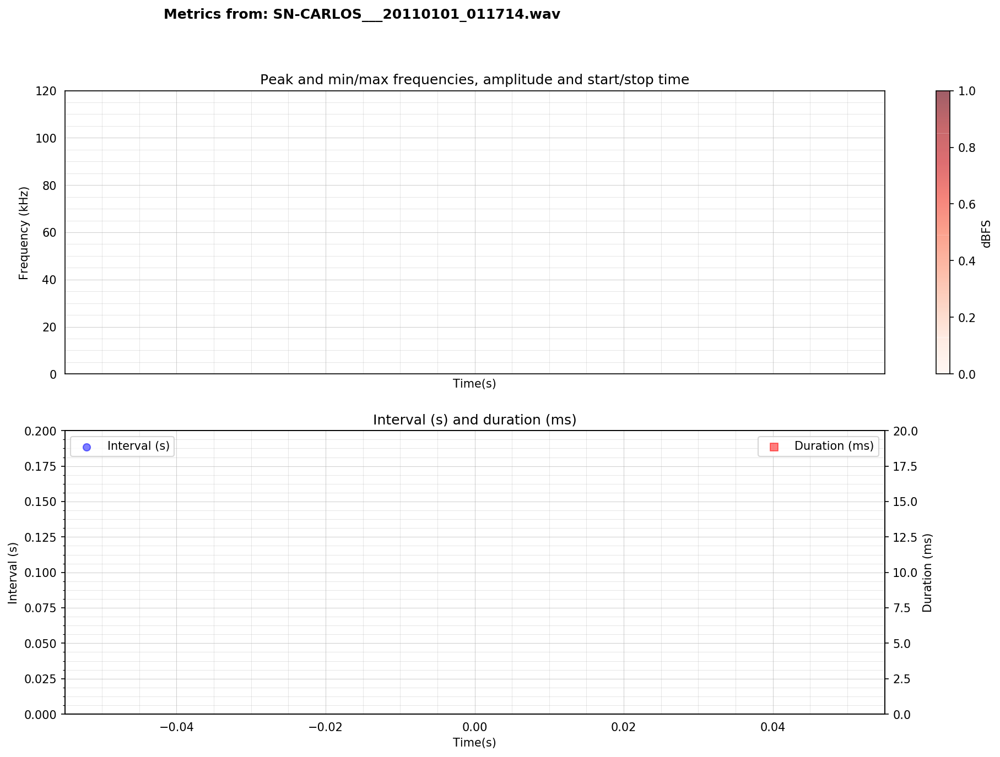

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011747.wav
Noise level:  0.00685    Noise (db):  -43.29


..\dsp4bats\time_domain_utils.py:31: RuntimeWarning: divide by zero encountered in log10


Noise level:  0.0    Noise (db):  -inf
Detected peak counter: 3


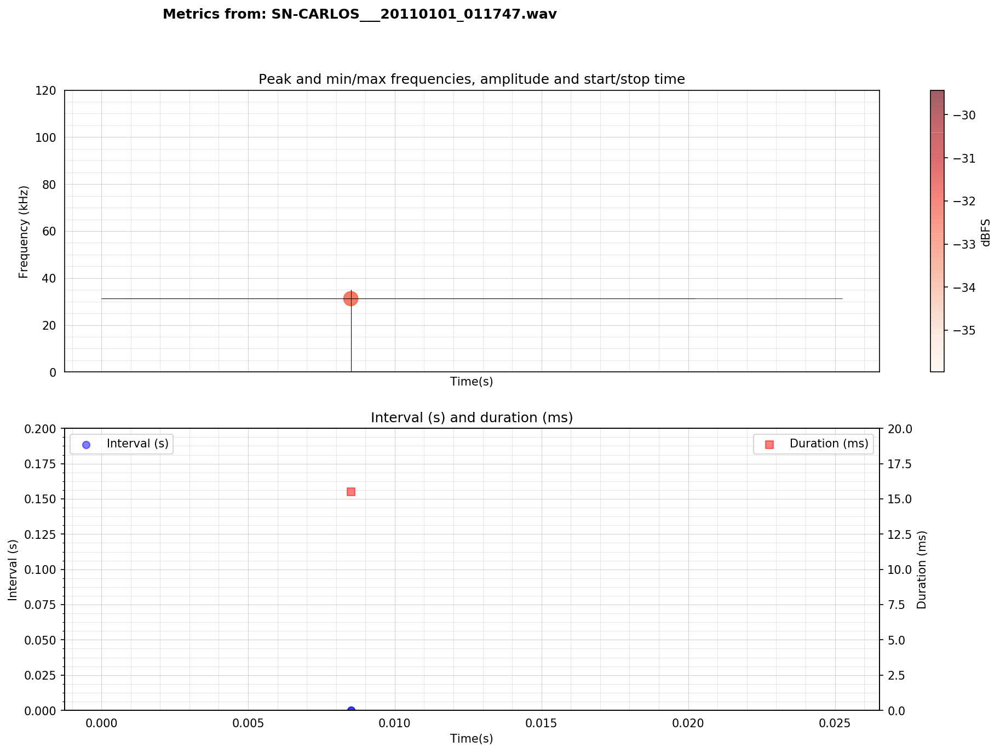

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011807.wav
Noise level:  0.01557    Noise (db):  -36.16
Detected peak counter: 0


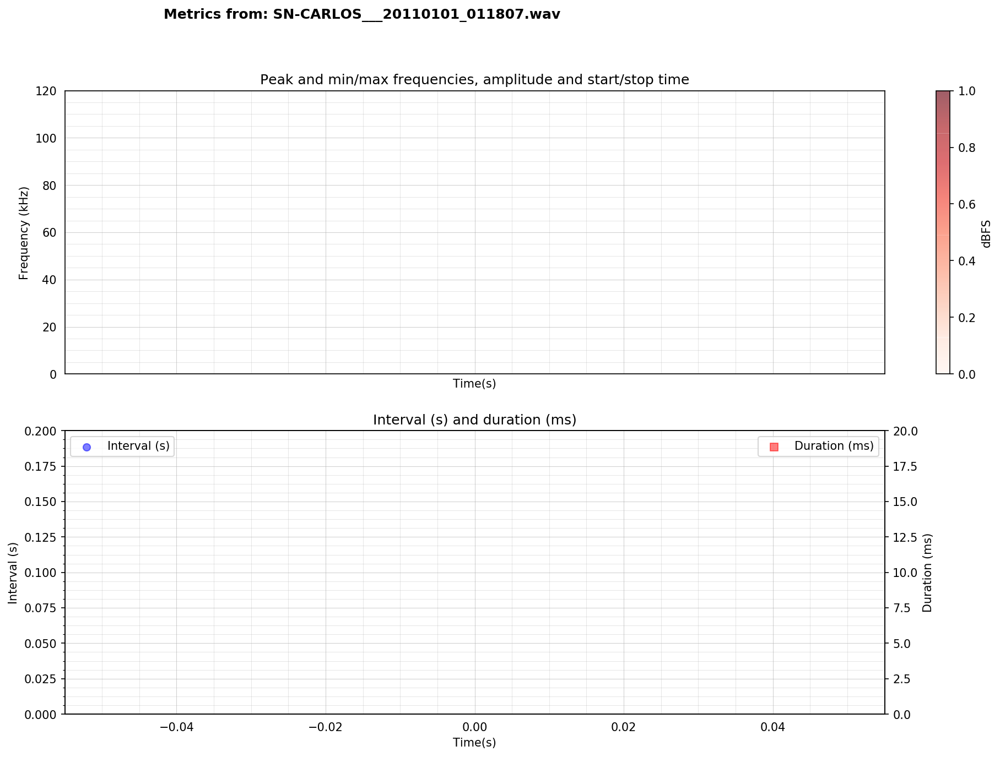

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011825.wav
Noise level:  0.0091    Noise (db):  -40.82
Detected peak counter: 0


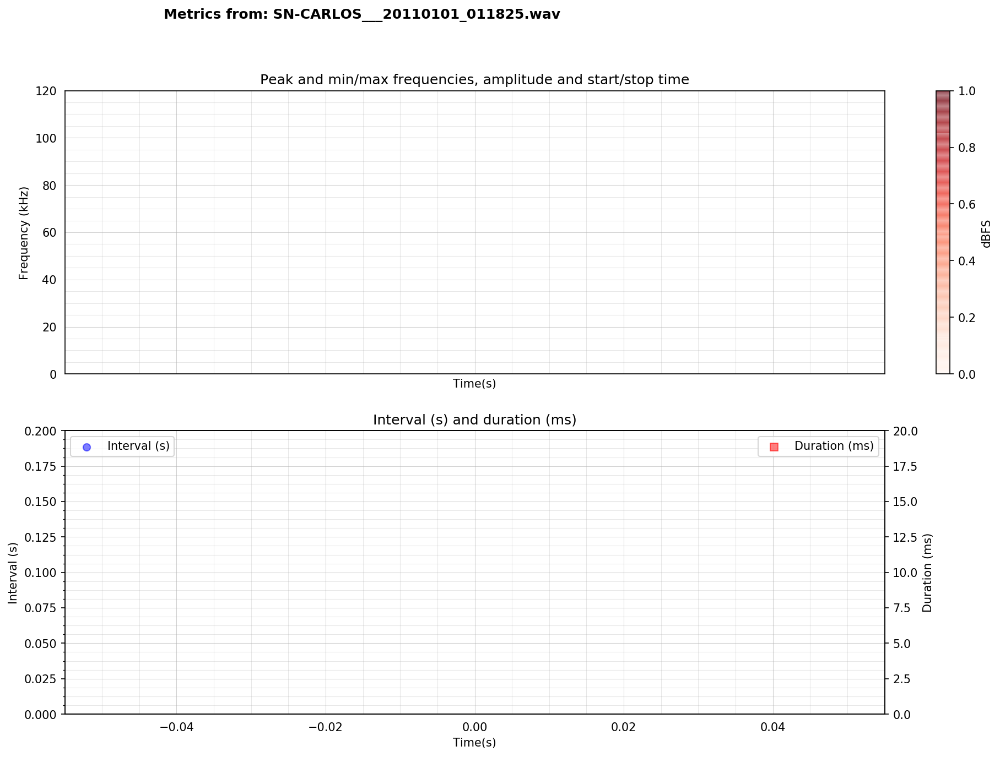

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_011857.wav
Noise level:  0.00937    Noise (db):  -40.57
Detected peak counter: 0


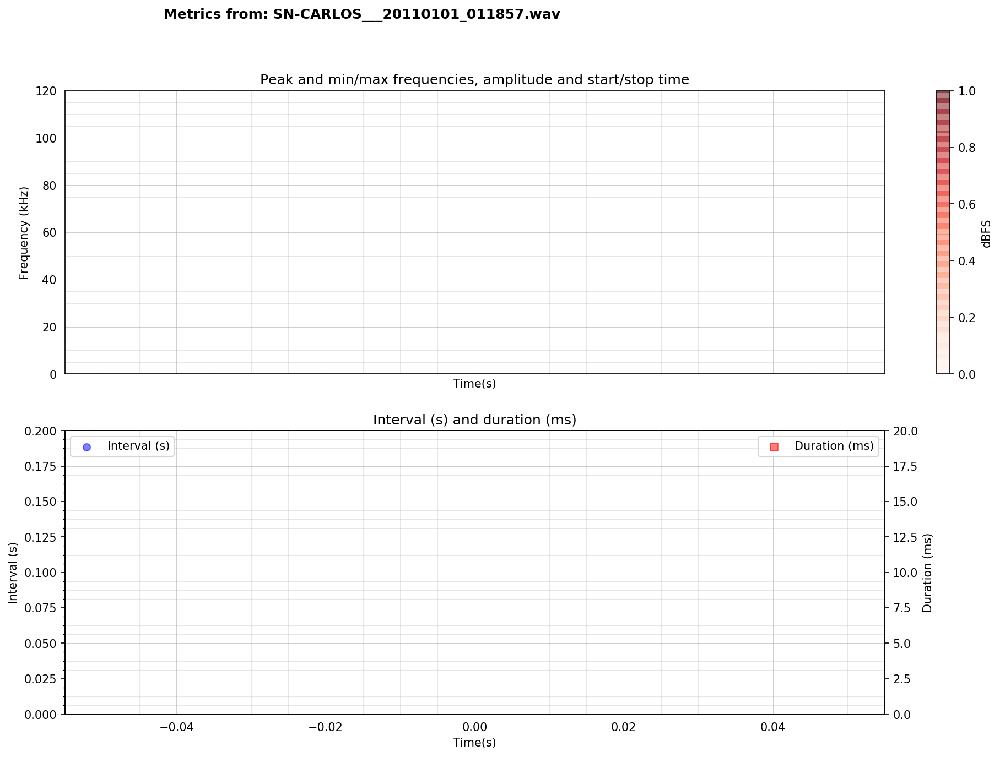

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_012232.wav
Noise level:  0.01    Noise (db):  -40.0
Detected peak counter: 0


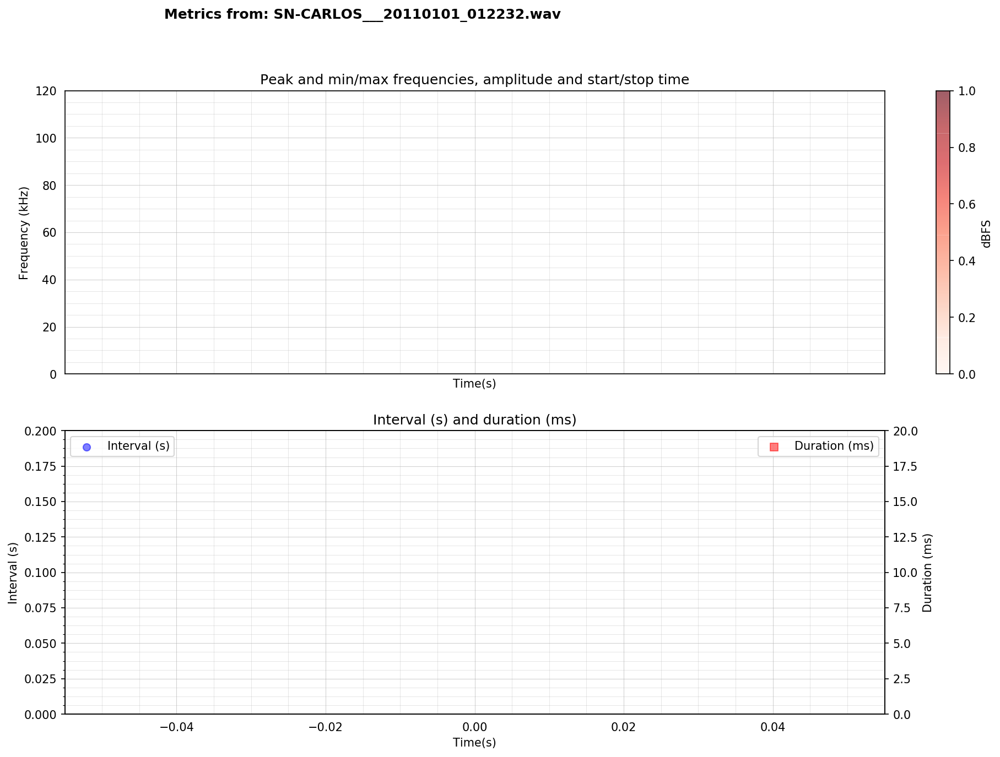

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_012240.wav
Noise level:  0.01031    Noise (db):  -39.73
Detected peak counter: 0


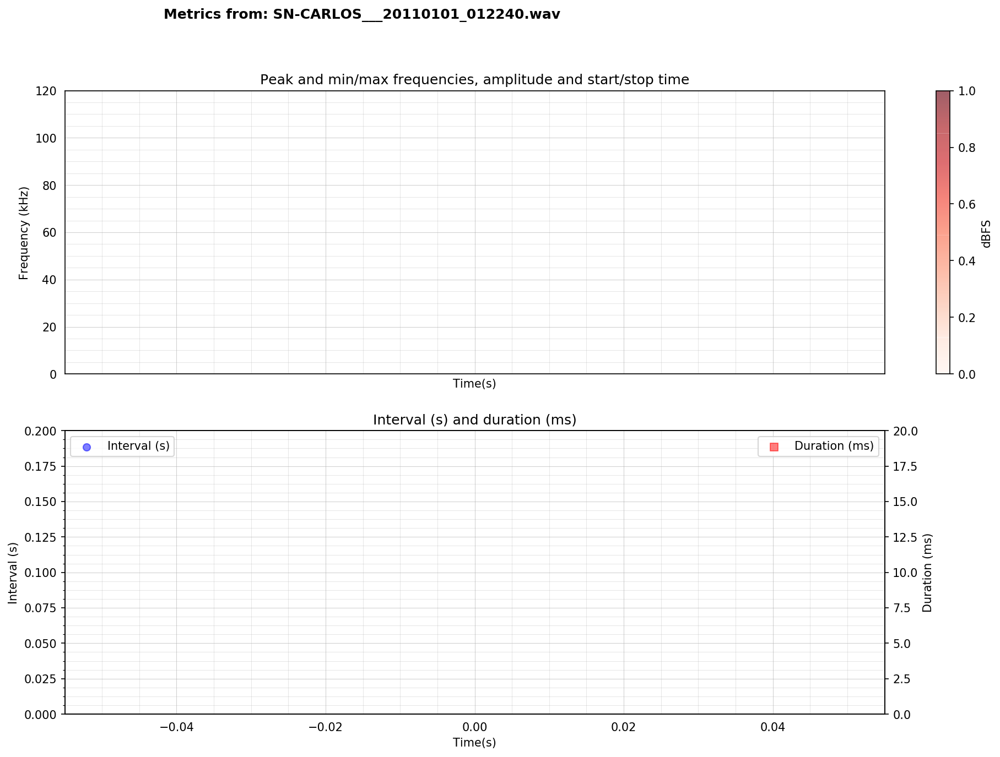

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_012319.wav
Noise level:  0.00915    Noise (db):  -40.77
Detected peak counter: 0


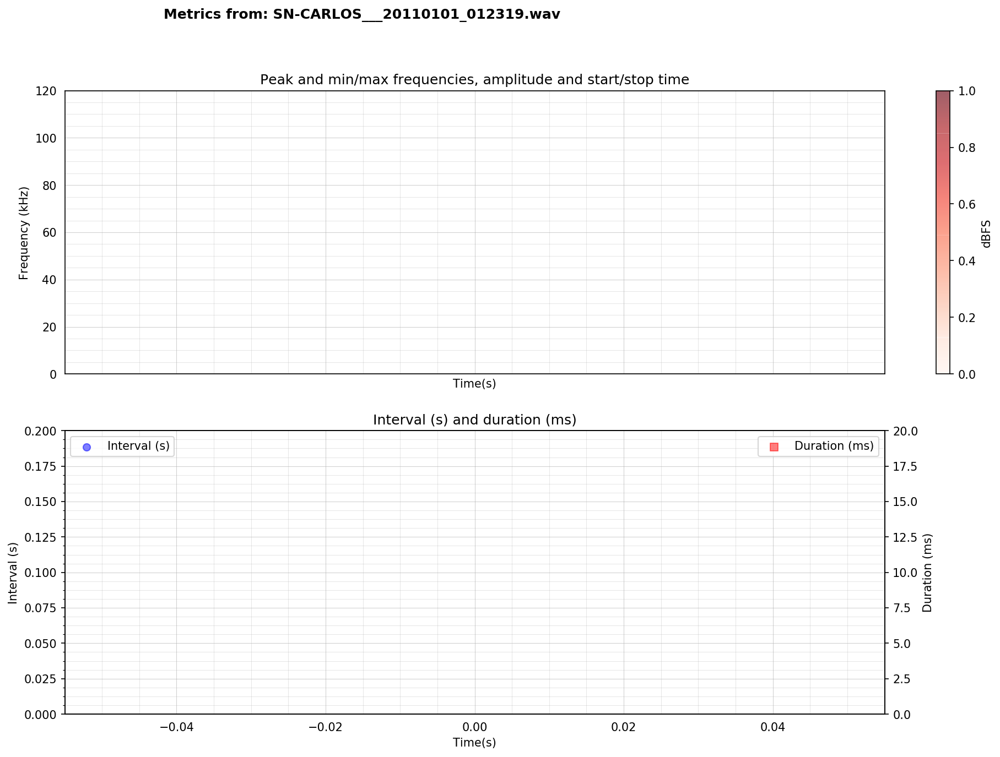

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_013522.wav
Noise level:  0.01915    Noise (db):  -34.36
Detected peak counter: 2


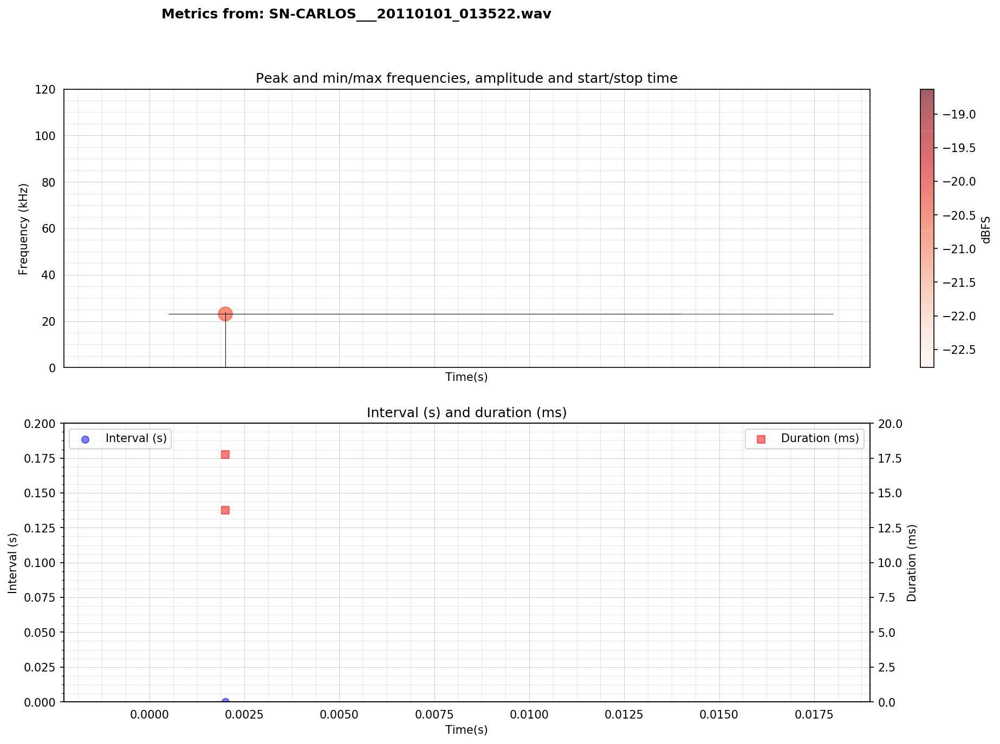

C:\Users\Vicentico\Dropbox\Grabaciones SS\Vivero 081119\SN-CARLOS___20110101_013524.wav
Noise level:  0.01924    Noise (db):  -34.31
Detected peak counter: 0


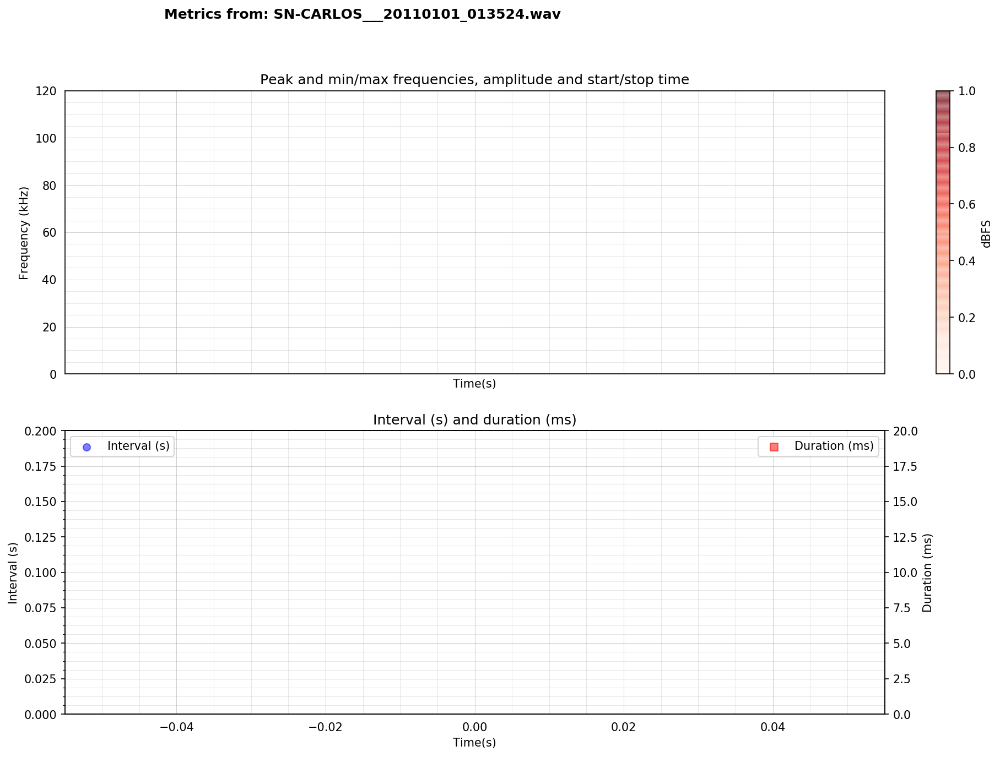

In [12]:
# Calculate and plot metrics for Mdau.
for i in os.listdir(direct):
    print(direct+"\\"+i)
    sound_file_path=(direct+"\\"+i)
    metrics_file_path=(direct+"\\"+i)+"_Metrics.txt"
    plot_file_path=(direct+"\\"+i)+"_Metrics.png"
    
    sampling_freq = read_file_and_extract_metrics()
    peak_df = read_metrics_from_file()
    plot_diagrams()
# Settings.
#sound_file_path = 'EUMUND_20191109_205301.wav'
#metrics_file_path = 'EUMUND_20191109_205301_Metrics.txt'
#plot_file_path = 'EUMUND_20191109_205301_Metrics.png'

# Run it.


In [ ]:
peak_df

In [18]:
reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y
